<a href="https://colab.research.google.com/github/priyanships31/Company_Classification/blob/main/Team_5_Capstone_Project_Company_Classification_Capstone_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Problem 

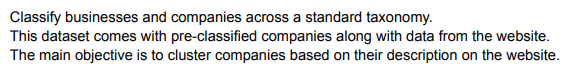

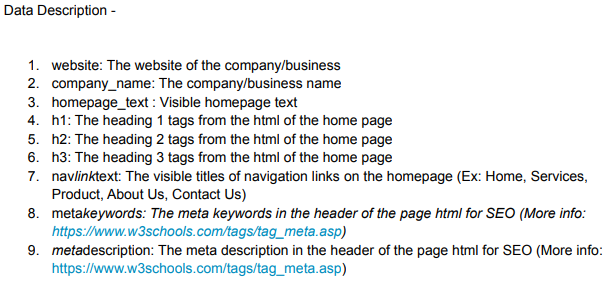

In [ ]:
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt

In [ ]:
path = '/content/drive/MyDrive/Cohort Nilgiri/Module 4/Unsupervised Learning Capstone Project/data_company_classification.csv'

In [ ]:
# let's load the data
df = pd.read_csv(path)

# Exploring the data and null values

In [ ]:
# have a look at the data
df.head()

,website,company_name,homepage_text,h1,h2,h3,nav_link_text,meta_keywords,meta_description
0,bipelectric.com,bip dipietro electric inc,Electrici...,NaN,NaN,NaN,NaN,"electricians vero beach, vero beach electrical...","Providing quality, reliable full service resid..."
1,eliasmedical.com,elias medical,site map | en español Elias Medical h...,Offering Bakersfield family medical care from ...,Welcome to ELIAS MEDICAL#sep#Family Medical Pr...,Get To Know Elias Medical#sep#Family Medical P...,NaN,Elias Medical bakersfield ca family doctor med...,For the best value in Bakersfield skin care tr...
2,koopsoverheaddoors.com,koops overhead doors,Home About Us Garage Door Repair & Servi...,NaN,Customer Reviews#sep#Welcome to Koops Overhead...,NaN,NaN,"Koops Overhead Doors, Albany Garage Doors, Tro...","Koops Overhead Doors specializes in the sales,..."
3,midtowneyes.com,midtown eyecare,918-599-0202 Type Size...,NaN,Welcome to our practice!,NaN,NaN,NaN,We would like to welcome you to Midtown Eyecar...
4,reprosecurity.co.uk,repro security ltd,Simply fill out our form below...,NaN,Welcome to REPRO SECURITY Ltd,NaN,NaN,NaN,Repro Security provide a range of tailor made ...


In [ ]:
# size of data
df.shape

(73974, 9)

So we have 9 columns in our dataset.

In [ ]:
# null value analysis in each column
df.isnull().sum()

website                 0
company_name            0
homepage_text         669
h1                  27321
h2                  20762
h3                  29315
nav_link_text       25924
meta_keywords       50302
meta_description     7088
dtype: int64

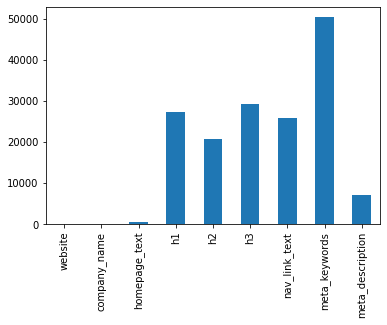

In [ ]:
df.isnull().sum().plot.bar()

Two columns website and company_name has no null values. Homepage_text also has almost no null values.

I can make one heading column by combining h1,h2 and h3.

In [ ]:
# making a new column by combining h1,h2,h3

df['headings'] = df['h1'].fillna('') + ' ' +df['h2'].fillna('') + ' ' + df['h3'].fillna('')

In [ ]:
# dropping indivisual headings columns
df.drop(['h1','h2','h3'], axis=1, inplace=True)

In [ ]:
df.columns

Index(['website', 'company_name', 'homepage_text', 'nav_link_text',
       'meta_keywords', 'meta_description', 'headings'],
      dtype='object')

In [ ]:
# now againg get the idea of null values in rest columns
df[['homepage_text', 'nav_link_text','meta_keywords', 'meta_description']].isnull().sum()

homepage_text         669
nav_link_text       25924
meta_keywords       50302
meta_description     7088
dtype: int64

In [ ]:
# getting null value distribtuion row wise
df[['homepage_text', 'nav_link_text','meta_keywords', 'meta_description']].isnull().sum(axis=1).value_counts()

1    44319
2    14671
0    11660
3     2974
4      350
dtype: int64

In these four columns 350 rows has all of them missing. We should remove the rows where at least three of them are missing.



In [ ]:
# making a column which has the count of null values in these four columns : 'homepage_text', 'nav_link_text','meta_keywords', 'meta_description'

df['null_count'] = df[['homepage_text', 'nav_link_text','meta_keywords', 'meta_description']].isnull().sum(axis=1)

In [ ]:
# getting the rows with more than three missing values out of the four columns mentioned above
df = df[df['null_count']<3]

df.reset_index(inplace=True, drop=True)

In [ ]:
df.shape

(70650, 8)

In [ ]:
df.columns

Index(['website', 'company_name', 'homepage_text', 'nav_link_text',
       'meta_keywords', 'meta_description', 'headings', 'null_count'],
      dtype='object')

In [ ]:
# dropping the 'null_count' column
df.drop('null_count', axis=1, inplace=True)

Now we will combine the text information from all the columns into a single column

In [ ]:
# before combining the columns
# we need to replace null values with empty strings
df.fillna('', inplace=True)

In [ ]:
# making single columns with all text information
# separated by space
df['text'] = df['homepage_text'] + ' ' + df['nav_link_text'] + ' ' + df['meta_keywords'] + ' ' + df['meta_description'] + ' ' + df['headings']

In [ ]:
# keeping only important columns in a separate dataframe
data = df[['website', 'company_name', 'text']]

## Looking at special characters in our data

In [ ]:
s = 'abcdefghijklmnopqrstuvwxyz ABCDEFGHIJKLMNOPQRSTUVWXYZ'
specials = set()

In [ ]:
for text in df['text']:
    for c in text:
        if c not in s:
            specials.add(c)

In [ ]:
to_unicode('bunty濯🏠𝙖 bhai 💕')

'bunty bhai '

In [ ]:
for special in specials:
    print(special[:2000])

Streaming output truncated to the last 5000 lines.


养
Ñ
😞
한
减
疯
ť
叠
刺

±
筏
哪

께
乏
🥶
ニ
辖
💘
拧
⇨
責
ắ
ล
乃
💛
🤷

啡
ੁ
泓

ฆ
“
𝗣
☑
川
幸

気
劃
ー
彩
다
ໍ
Х
ो
港


带
夫
読
章
ु
↔
剛
众
阳
羙
Į
要
嫩
丹
根
放
到
汇

發
橋
아
载
仿
🍽
烯
૫
⋮
💞
‑
찾
غ
隊
ಷ
절
🤤
郴
변
葡
宋
翅
洞
收

個
ീ
客
Ｚ
ದ
克

誠
郊
济
用
以
󠁧
美

韵
渐

거
Ν
塗
防
📈
ὶ


🏼
디
思
વ

న
🏔
为
規
🎖

ሻ
事
𝐎
剥
👯
贷
ಯ
更
晤

芳
菱
昭
辨
偷
⧉
喹
采
凰
ꜰ
瑟
俊
男

织
奷
ぜ
倍
ế

秦
屌
囵
켓



夕

펌
ὰ

್
袋

š
ร
南


თ
反
ಶ
ি
≠

🥪
砥
ॉ
💫
Š
법
μ
递
枢
橡
医
舰
ਹ
潤
네
혜

ф
鉢
👑
鹰
磁
勿
穷
狙

怡
ك
瘫
３
诣

𝘵
ద
梓
轨
纪
绩
没
⨉
𝐯
被
射
ೖ
せ

ฯ
肠
➡
部

ŷ
ᴜ
孚
處
郝
ይ

ஹ
🥞

В
哲
𝐃
林
貫
𝗧
易
📘
颖
胆
ς
록
°
椿
富
喷


凤
র
喜
飘
洒
リ
ジ
ಒ
う
ਅ
额
募
같
ɑ
芯
１
織
奉
預
🏁
ň
畢
助
洧
节


較
🍌
ಪ
ガ
踪

ě
ള
柚
􀃶
ਣ
耳
黛

署
𝙜
💬
👨
ಎ
勢
這
Í
硕
峽
箋

誰

町
Ę

钢
恩
큰
⎮

衝

📓

л
杭
胞

ŵ
へ
冬
ኣ
ῃ
砍
輕
祥
ម

𝐤
逢

➥
ơ
即
ɴ

💙
顕

徐
涵
宅
납
ਂ

处
ن
塘
ච

§

と
🔢
愈
權
艙
帶
喉

ஜ
術
遍
扎
👆
赛
⟶
右

반

💃

波
관
商
🕶
ṣ
吕
论
였
脸
枚
诠

戀
誘
്
退
Ě
⌘
◙
💗
🍎

〉
汎
💓
游
炮
９
仓

♤
𝙈
シ
蜘

ૈ
杜
邮
关
肯
ሚ

発
異
己
ހ
🍾
작
版
✨
₺
革

償
🇺
道
✈
貴
ｕ
📧
尖
歩
𝐍
แ

팅
捐
ḵ
ಿ
並
চ
争
创
침
ዘ


立
ത
庭
農

# Text Cleaning

In [ ]:
import string
import unicodedata as ud
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

from nltk.stem.snowball import SnowballStemmer

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
# this function removes emojis and also converts visually similar characters to normat Lating characters
def to_unicode(text):
    return ud.normalize('NFD', text).encode('ascii','ignore').decode('utf-8')

# function to remove punctuations
def remove_punctuation(text):
    text = text.lower()
    lst = [c for c in text if c not in string.punctuation]
    return ''.join(lst)


stop_words = stopwords.words('english')
stop_words.extend(['contact','us'])

# function to remove stopwords
def remove_stopwords(text):
    lst = [word for word in text.split() if word not in stop_words]
    return ' '.join(lst)

# we also need to remove numbers from the text
def remove_number(text):
    return ''.join([i for i in text if not i.isdigit()])

stemmer = SnowballStemmer('english')

# function for stemming
def stemming(text):
    l = [stemmer.stem(word) for word in text.split()]
    return " ".join(l)

In [ ]:
# function for cleaning text
def clean_text(text):
    text = to_unicode(text)
    text = remove_punctuation(text)
    text = remove_stopwords(text)
    text = remove_number(text)
    text = stemming(text)

    return text

In [ ]:
# cleaning the text column
data['text'] = data['text'].apply(clean_text)

In [ ]:
data.columns

Index(['website', 'company_name', 'text'], dtype='object')

In [ ]:
data.shape

(70650, 3)

In [ ]:
data.head()

,website,company_name,text
0,bipelectric.com,bip dipietro electric inc,electrician electr contractor serv vero beach ...
1,eliasmedical.com,elias medical,site map en espanol elia medic home skin care ...
2,koopsoverheaddoors.com,koops overhead doors,home garag door repair servic designadoor gara...
3,midtowneyes.com,midtown eyecare,type size home practic servic patient form eye...
4,reprosecurity.co.uk,repro security ltd,simpli fill form back touch arrang free oblig ...


In [ ]:
data['text'].shape

(70650,)

In [ ]:
data['text'].values

array(['electrician electr contractor serv vero beach fl indian river counti florida area fifteen year local own oper bip dipietro electr dedic provid help reliabl electr servic residenti commerci retail client alik fulli licens insur expert staff electrician readi serv vero beach area time week day night bip dipietro electr full servic firm special area electr instal commerci residenti build alik believ job need done need done right employe bip dipietro electr strive give client exact plan specifi instal way meant instal electr necess day also technolog must treat caution respect electrician bip dipietro electr certifi know mean corner cut item left job done right way would like thank take time visit web site feel free look around site pleas question compani servic may provid bip dipietro electr vero beach electr contractor extern link disclaim make payment copyright present associ inc dba dna web servic design host email mainten provid dnawebservicesus electrician vero beach vero bea

In [ ]:
# saving the cleaned data into a new csv file
path = '/content/drive/MyDrive/Cohort Nilgiri/Module 4/Unsupervised Learning Capstone Project/cleaned.csv'

data.to_csv(path, index=False)

# Vectorization

In [ ]:
path = '/content/drive/MyDrive/Cohort Nilgiri/Module 4/Unsupervised Learning Capstone Project/cleaned.csv'

data = pd.read_csv(path)

In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

In [ ]:
# creating vectorizer object
vectorizer = TfidfVectorizer(max_df=0.8, min_df=0.02)

In [ ]:
X = vectorizer.fit_transform(data['text'])

In [ ]:
X.shape

(70650, 1734)

# Making Clusters

Clustering such huge data on CPU will take a lot of time. So we have to create clusters on GPU. For that we're using kmeanstf library which is build on top of TensorFlow and runs on GPU.

In [ ]:
%%capture
!pip install kmeanstf

In [ ]:
from kmeanstf import KMeansTF
from scipy.spatial.distance import cdist

In [ ]:
type(X)

scipy.sparse.csr.csr_matrix

In [ ]:
X = X.toarray()

## Deciding the number of Clusters

In [ ]:
# Within Cluster sum of Squares score
# for determining the right number of clusters
distortions = []

In [ ]:
K = range(2,21)
for k in K:
    model = KMeansTF(n_clusters=k, random_state=42)
    model.fit(X)
    distortions.append(sum(np.min(cdist(X, model.cluster_centers_, 'euclidean'), axis=1)) / X.shape[0])

In [ ]:
len(distortions)

19

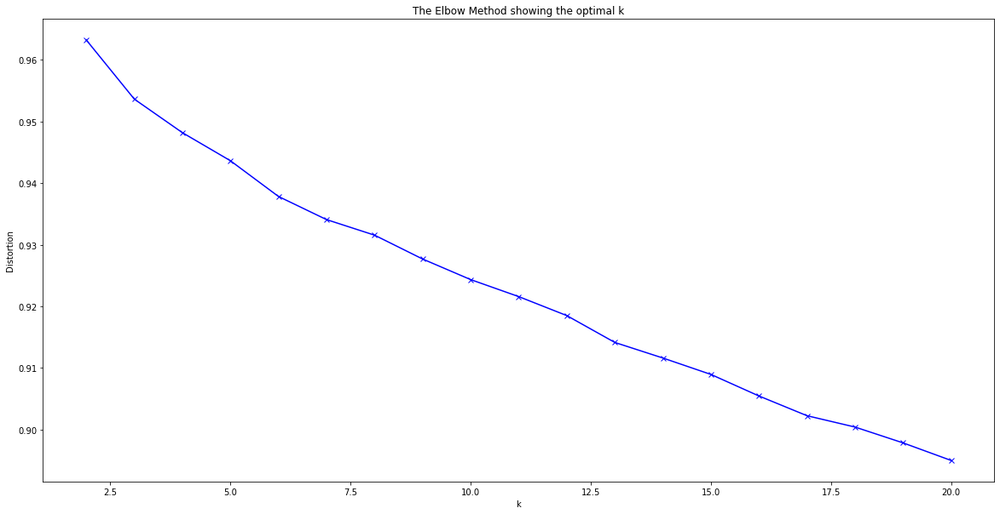

In [ ]:
# Plot the elbow
plt.figure(figsize=(20,10))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

If we look carefully, we can observe that between k=12 to 13, there is a relatively significant drop in the score but after k=12, there is no significant dip in the graph. So we can go with 12 clusters.

Now let's try sihoutte score

In [ ]:
from sklearn.metrics import silhouette_score

Calculating sihoutte_score is a complex process and will take forever on a dataset this huge. But! We have a solution. Instead of using whole cluster, we can use a sample of each cluster to calculate Silhoutte scores and can decide on number of clusters.

In [ ]:
def sample_silhoutte_score(X, y, ratio=0.1):
    # getting number of clusters
    k = max(y)+1

    # create a dictionary where keys are cluster label
    # and values are list of indices of the points alotted to the label
    cluster_dict = {i:np.where(y==i)[0] for i in range(k)}

    # creating samples
    y_sample = []
    X_sample = []

    for i in cluster_dict.keys():
        sample_size = int(cluster_dict[i].shape[0]*ratio)
        indexes = np.random.choice(a=cluster_dict[i], size=sample_size)
        sample = np.take(a=X, indices=indexes, axis=0)
        labels = [i]*sample_size
        y_sample.extend(labels)
        X_sample.extend(sample)

    return silhouette_score(np.array(X_sample), y_sample)


In [ ]:
scores = []

for k in range(2,21):
    model = KMeansTF(n_clusters=k, random_state=42)
    y = model.fit_predict(X)
    # taking 30% ratio
    score = sample_silhoutte_score(X, y, ratio=0.3)
    scores.append(score)

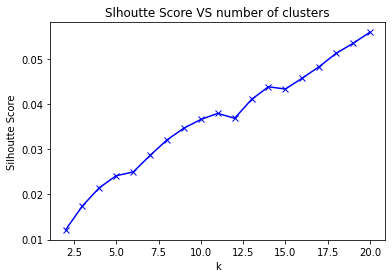

In [ ]:
plt.plot(range(2,21), scores, 'bx-')
plt.xlabel('k')
plt.ylabel('Silhoutte Score')
plt.title('Slhoutte Score VS number of clusters')
plt.show()

In the above plot also silhoutte score went down after 12 to 13. So we are going to make 12 clusters.

## Let's Make 12 Clusters

In [ ]:
kmeanstf = KMeansTF(n_clusters=12, random_state=42)

In [ ]:
y = kmeanstf.fit_predict(X)

matrix too large for GPU: bytes 5,880,340,800, k=12 n=70,650 d=1734 numsize=4, max_mem=11,626,086,400
automated slicing started
set 'verbose' to 1 to see more details
fraction matrix too large for GPU: bytes 2,940,170,400, k=12 n=35,325 d=1734 numsize=4, max_mem=5,880,340,799


In [ ]:
y = np.array(y)

In [ ]:
labels, freqs = np.unique(y, return_counts=True)
cluster_df = pd.DataFrame({'Cluster':labels, 'Frequency':freqs})

cluster_df

,Cluster,Frequency
0,0,1470
1,1,9258
2,2,2268
3,3,4348
4,4,3300
5,5,4399
6,6,4274
7,7,4922
8,8,1307
9,9,31240


In [ ]:
data['label'] = y

In [ ]:
# let's collect text for all four clusters

text = []

for i in range(12):
    df_ = data[data['label']==i]
    text.append(' '.join(list(df_['text'])))

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


In [ ]:
del df_

In [ ]:
# saving the labels as csv
pd.DataFrame({'Labels':y}).to_csv('/content/drive/MyDrive/Cohort Nilgiri/Module 4/Unsupervised Learning Capstone Project/rf42c12.csv',index=False)

In [ ]:
y = pd.read_csv('/content/drive/MyDrive/Cohort Nilgiri/Module 4/Unsupervised Learning Capstone Project/rf42c12.csv')

In [ ]:
y = np.array(y['Labels'])

In [ ]:
len(text)

12

In [ ]:
from wordcloud import WordCloud

In [ ]:
# fucntion to create wordcloud
def word_cloud(text):
    wordcloud = WordCloud().generate(text)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

## Explore the clusters

In [ ]:
labels=[]

In [ ]:
df['labels'] = y

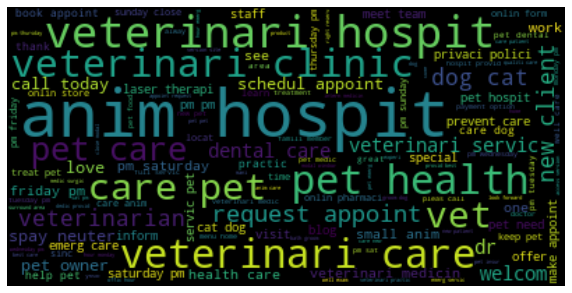

In [ ]:
word_cloud(text[0])

In [ ]:
labels.append('Pet Healthcare')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==0].index), 5),:]['homepage_text']:
    print(s)

                                                                      Call Us Today!  (360) 377-0078     Follow us on…                     Welcome  About Us    Our Practice   Our Veterinarians   Our Careteam   Hospital Tour   Patient Gallery   Pet Memorial     Services    Our Services   Wellness   Diagnostics   Surgery   Dental     Resources    Request an Appointment   Request a Refill   New Client Registration Form   Feedback Survey   Pet Library   Web Resources     Blog  Contact Us                                          Welcome!  Wheaton Way Veterinary Hospital is a full-service veterinary medical facility, located in Bremerton, WA. Our professional and courteous staff is dedicated to providing the best possible medical care, surgical care and dental care for our patients, while also offering exceptional service to our valued clients. We are committed to promoting responsible pet ownership, preventative health care and health-related educational opportunities for our clients. We lo

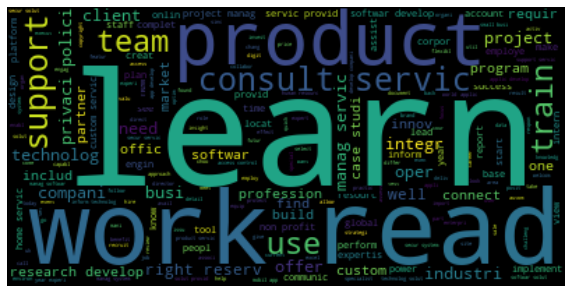

In [ ]:
word_cloud(text[1])

In [ ]:
labels.append('IT Services')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==1].index), 5),:]['homepage_text']:
    print(s)

                          Stark       Services      Data      Electricity    Gas    Water        Analytics – Stark ID    Stark Plus    Metering      Sub-metering    Gas MAM    Water AMR            Resources      News    Success Stories    Training and Webinars    Degree Days For Free        About    Contact us    Sign in         Contact    Menu             Services  Toggle      Data  Toggle      Electricity    Gas    Water        Analytics – Stark ID    Stark Plus    Metering  Toggle      Sub-metering    Gas MAM    Water AMR            Resources  Toggle      News    Success Stories    Training and Webinars        About    Contact us    Sign in                     Sub-metering  Even more detail for your energy data  Metering specific tenants, processes and buildings makes identifying savings easy.   Contact us          What is sub-metering?  By installing a sub-meter or data logger downstream from the utility meter, you can measure the consumption, impact and efficiency of specific equi

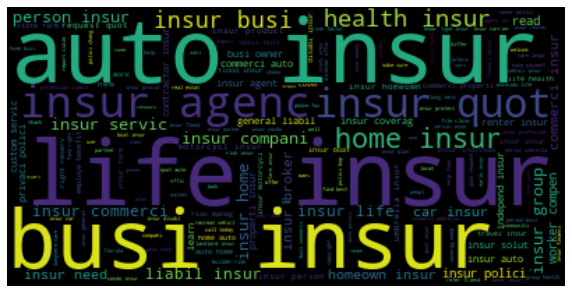

In [ ]:
word_cloud(text[2])

In [ ]:
labels.append('Insurance')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==2].index), 5),:]['homepage_text']:
    print(s)

          Facebook      Twitter      Google                     Home   About Us    Insurance by Industry   Care Homes  Construction & Allied Trades  Motor Trade  Public Houses  Restaurants & Cafes  Shops & Offices  Surgeries  Tradesman  Tyre Retreaders  Warehouse & Factories    Insurance Products   Business Insurance  Business Interruption  Contract Works  Cyber Insurance  Directors & Officers  Engineering & Inspection  Group Medical  Legal Expenses  Professional Indemnity  Professional Liability    Private Client   High Value Household  High Value & Classic Cars  Family Fleet  Overseas Property  Private Medical    Motor   Mini Fleet  Fleet  Vans & HGV  Haulage  Courier    Property   Residential Let  Commercial Let  Unoccupied  Block of Flats  Property Developers  Landowners    Risk & Specialist   Claims & Risk Management  Financial Accounts  Trade Credit    Our Blog  Contact Us         Select Page                                   We mind your business.  C&M Insurance can provide inde

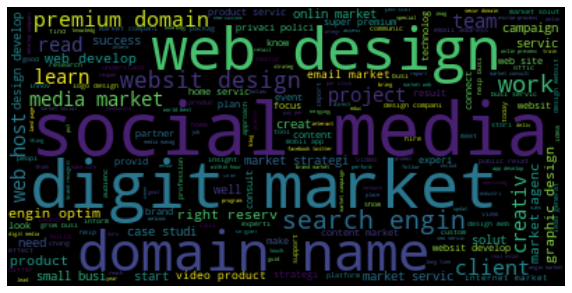

In [ ]:
word_cloud(text[3])

In [ ]:
labels.append('Digital Marketing')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==3].index), 5),:]['homepage_text']:
    print(s)

            1.905-417-9470                   1.905.417.9470  FOR DIGITAL MARKETING                 Home  About   Digital Marketing Philosophy  Team    Services   Website Design and Development  Search Engine Optimization  Social Media Marketing  PPC Management  Display Advertising  Analytics    Gallery  Blog  Cool Tools  Results  Contact Us          1   2   3   4     Slice 1 - Image 1  Slice 1 - Image 2  Slice 1 - Image 3  Slice 1 - Image 4    Slice 2 - Image 1  Slice 2 - Image 2  Slice 2 - Image 3  Slice 2 - Image 4    Slice 3 - Image 1  Slice 3 - Image 2  Slice 3 - Image 3  Slice 3 - Image 4    Slice 4 - Image 1  Slice 4 - Image 2  Slice 4 - Image 3  Slice 4 - Image 4           How can we Help?      Inspired Website Design     Website Design & Development      Proven-Results SEO     Search Engine Optimization      Social Media Done Different     Social Media Marketing        Turn the Traffic Faucet On     Pay-per-click      Extend Your PPC     Display Advertising      Track. Measure.

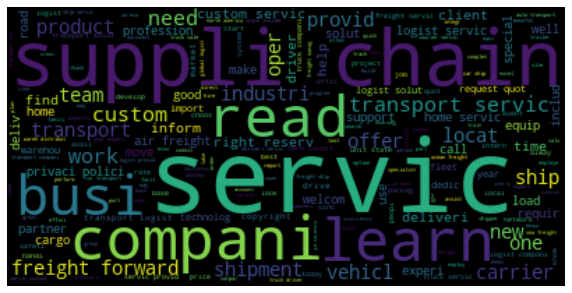

In [ ]:
word_cloud(text[4])

In [ ]:
labels.append('Logistics')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==4].index), 5),:]['homepage_text']:
    print(s)

 CALL US 816.629.3400  APPLY TO DRIVE    Home About Us Company Awards & Press Safety & The Environment Leadership Team Waller Blog Waller Equipment Equipment Sales Our Services Logistics Services Shipping Services Shuttling Services Brokerage Services For Drivers Current Drivers Future Drivers Orientation Driver Application Contact Us   local: 816.629.3400  Toll Free: 800.821.2196  apply to drive  Home About Us Company Awards & Press Safety & The Environment Leadership Team Waller Blog Waller Equipment Equipment Sales Our Services Logistics Services Shipping Services Shuttling Services Brokerage Services For Drivers Current Drivers Future Drivers Orientation Driver Application Contact Us Waller Truck Co. MIDWEST TRUCKING COMPANY    Our Services      Drive Waller   Quality. Honesty. Fairness. Uncompromised Customer Service  Our Equipment   Located in the heart of America, Waller Truck Co., Inc. is strategically located to provide top quality dry goods shipping services for regional JIT 

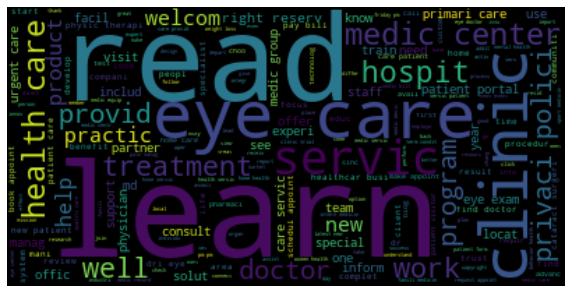

In [ ]:
word_cloud(text[5])

In [ ]:
labels.append('Eye Care')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==5].index), 5),:]['homepage_text']:
    print(s)

                                                                     Home About   Accreditation  Fees  Opening Hours  Patient Information  Privacy Policy  Doctors Services   Allergy Treatments  Child Health  Dermatology  Dietitian  Health Assessments  Home-Based Sleep Study  Immunisations  Medicals – CASA, Dive & Other  Men’s Health  Mental Health  Travel Health  Women’s Health  Workplace Health  Appointments Blogs   2020  2019  2018  Contact           Menu                                MAKE A BOOKING                      Welcome to Illawarra Medical Centre      Illawarra Medical Centre is a family medical practice based in Ballajura, Western Australia, providing a wide range of health care services for patients. We offer bulk billing to concession card holders, pensioners and children under 16 years of age. As the home of SmartVax , we use SMS and smartphone technology to actively monitor the vaccine safety of our patients.      Learn More                                OPENING HOURS

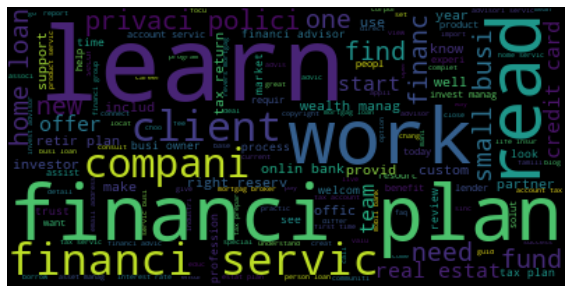

In [ ]:
word_cloud(text[6])

In [ ]:
labels.append('Finance')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==6].index), 5),:]['homepage_text']:
    print(s)

           Cookies help us deliver and improve our services. By using or browsing Moneybarn you agree to our use of cookies.  Learn more .                  My Moneybarn    Contact us               Car finance  Car finance    Car finance    Bad credit car finance    Car finance calculator    Car finance explained    Car finance brands      Motorbike finance  Motorbike finance    Motorbike finance    Bad credit motorbike finance    Motorbike finance explained    Motorbike finance brands    Motorbike types      Van finance  Van finance    Van finance    Van finance calculator    Which van brand is right for me?      Understanding bad credit  Understanding bad credit    Understanding bad credit    Bad Credit Explained    How it works    CCJ car finance    IVAs and car finance    Self-employed vehicle finance      FAQs and guides  FAQs and guides    FAQs and guides    FAQs    The application process    Buying your next vehicle    Advice and tips    Latest motor news      About us  About us 

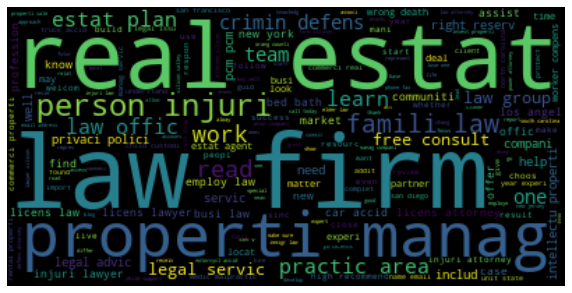

In [ ]:
word_cloud(text[7])

In [ ]:
labels.append('Real Estate and Legal')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==7].index), 5),:]['homepage_text']:
    print(s)

  CALL US:  (801) 393-1106  SCHEDULE A CONSULTATION  →   Open/Close Menu      Skip to content HOME FAMILY LAW AREAS FIRM OVERVIEW ATTORNEYS / STAFF BLOG TESTIMONIALS PAYMENTS CLIENT PORTAL CONTACT  Real People, Real Problems, Real Solutions.  We've chosen to focus on the area that impacts your life most.  We understand your family weighs heavily on your mind and your heart.  Helping you navigate your case with knowledge and compassion.              Family Law Read more →       Divorce Read more →       Custody & Parent Time Read more →       Alimony & Modifications Read more → “We’ve tailored our firm to handle issues related to one thing – Your Family” WHAT OUR CLIENTS ARE SAYING           This is not your typical penny squeezing law firm! I felt that everyone I worked with had a genuine interest in my welfare and in resolving my case timely and effectively, especially Peter Bracken. I was looking for a law firm/lawyer that would give me an honest view of the options on both

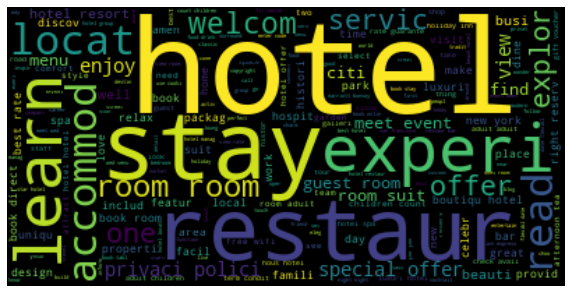

In [ ]:
word_cloud(text[8])

In [ ]:
labels.append('Hospitality')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==8].index), 5),:]['homepage_text']:
    print(s)

          Skip to main content        Toggle navigation           Austin  Burlington  Florham Park  Napa  New York  Redmond  Tysons        Best Deal Here  Our Hotels    Austin  Burlington  Florham Park  Napa  New York  Redmond  Tysons    Blog  Contact  Book /Modify Reservation    Call (855) 437-9100  Book        Close        Need to Book?    The following fields have errors:         Where are you going?    Austin  Burlington  Florham Park  Napa  New York  Redmond     Arrival Date     Departure Date     Number of Guests     Promotional Code     Group Code     Check Availability       Already Booked?    The following fields have errors:      Please select a hotel    Austin  Burlington  Florham Park  Napa  New York  Redmond     Email Address     Reservation Confirmation Number     Find Reservation         Best deal is right here, on archerhotel.com  Lowest Rates + Instant Amenity Credit  Good anywhere in the hotel except toward room rates.  $20 per reservation in Austin, Napa, New York $1

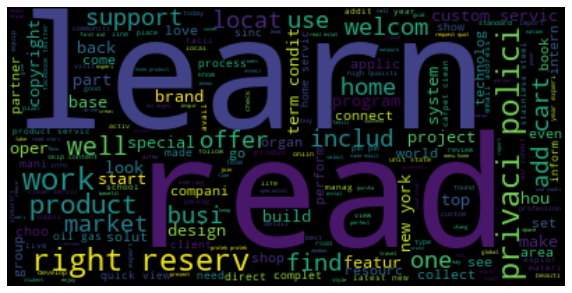

In [ ]:
word_cloud(text[9])

In [ ]:
labels.append('E Commerce')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==9].index), 5),:]['homepage_text']:
    print(s)

       609.683.0180  dfortunato@fortunatoarchitecture.com                     About Fortunato Architecture  Before And After  Fortunato Architecture Team  Projects  News  Careers  Client Testimonials  Contact Us      Select Page                                  Fortunato Architecture is a New Jersey, New York and Pennsylvania residential architecture firm.  Fortunato Architecture specializes  new home construction, as well as additions, renovations, decks, porches and basements.  In addition to architectural design, we alos provide construction administration services.                fortunato architecture’s mission      is to deliver superior architectural design and construction administration services by providing our clients with unparalleled customer service.  We accomplish this through intensive quality assurance and close collaboration between owners, design consultants, and building contractors regardless of the size or complexity of your project.  We pride ourselves on our pro

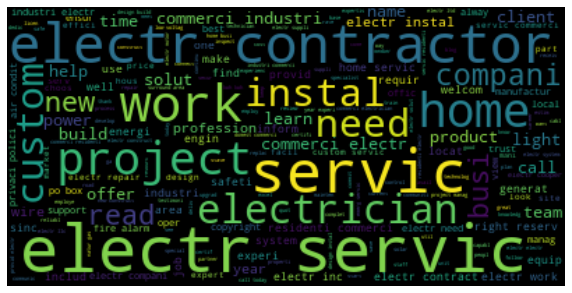

In [ ]:
word_cloud(text[10])

In [ ]:
labels.append('Home Service')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==10].index), 5),:]['homepage_text']:
    print(s)

  php/*
	if(get_field('slider_shortcode')) { $slider_shortcode = get_field('slider_shortcode'); }
	if(get_field('slider_shortcode')) { $do_slider_shortcode = do_shortcode($slider_shortcode); }
*/?            (360) 885-4479   Menu  Home  About Us  Electrical Contractors  Commercial  Portfolio  Contact Us        Think Positive when you need an expert electrical contractor.  Fill out the form for your free estimate           Please leave this field empty.          Electrician Vancouver WA  Residential Electricians Electrical Contractors Commercial Electricians Solar Panel Contractors          Our craftsmen care about the quality and safety of your project.  When you want an electrician in the greater Portland-Vancouver metropolitan area that will take care of your property the right way, give Positive Energy Electrical Contractors LLC a try.  Our contractors are experienced in both commercial and residential projects, so you can get a specialist out to you for whatever kind of property yo

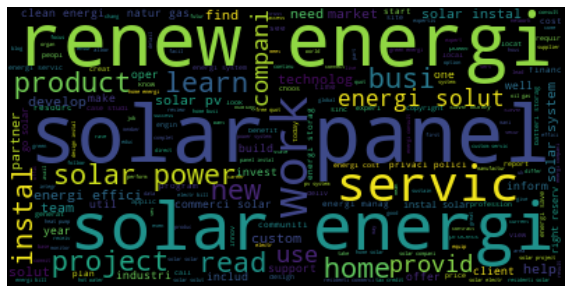

In [ ]:
word_cloud(text[11])

In [ ]:
labels.append('Renewable Energy')

In [ ]:
# look at some text samples of this cluster
for s in df.loc[random.sample(list(data[data['label']==11].index), 5),:]['homepage_text']:
    print(s)

                                                                     Home    Home                    Steeped in Tradition. Commited to Excellence.            New Website Coming Soon...    Dimension Energy Services is an industry leader in pipeline and facilities construction and maintenance.  We have a strong track record of executing and building high-quality projects to help our customers meet their oil & gas pipeline and facilities project objectives.    Dimension Energy Services, LLC    Headquarters  One Fluor Daniel Drive, Suite D1-7-50 Sugar Land, Texas 77478 Phone: 832-564-4500      General Information : Info@DimensionEnergyServices.com  Sales Inquiries : Sales@DimensionEnergyServices.com  Accounts Payable : AP@DimensionEnergyServices.com              Your Name (required)    Your Email (required)    Subject    Your Message                   © 2018 Dimension Energy Services. All Rights Reserved. Legal & Privacy       Phone: 832-564-4500  Email: info@DimensionEnergyServices.com  O

In [ ]:
labels

['Pet Healthcare',
 'IT Services',
 'Insurance',
 'Digital Marketing',
 'Logistics',
 'Eye Care',
 'Finance',
 'Real Estate and Legal',
 'Hospitality',
 'E Commerce',
 'Home Service',
 'Renewable Energy']

In [ ]:
cluster_df['Cluster'] = labels

In [ ]:
cluster_df

,Cluster,Frequency
0,Pet Healthcare,1470
1,IT Services,9258
2,Insurance,2268
3,Digital Marketing,4348
4,Logistics,3300
5,Eye Care,4399
6,Finance,4274
7,Real Estate and Legal,4922
8,Hospitality,1307
9,E Commerce,31240


The distribution of No of companies for each cluster.

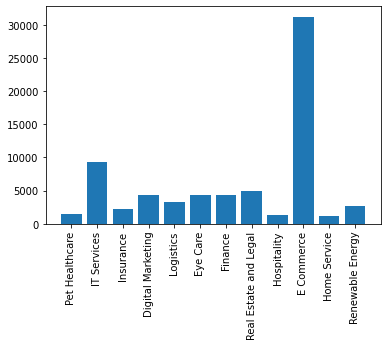

In [ ]:
plt.xticks(rotation=90)
plt.bar(labels, list(cluster_df['Frequency']))
plt.show()

So these were the clusters we got after applying it on whole dataset and those clusters make a lot of sense. Now we'll see a column vise analysis on the dataset and see what we get.

#Analysis on  'homepage_text' Column

In [ ]:
# Subsetting the 'homepage_text' column and removing NULL values
df_['homepage_text'] = df['homepage_text'].dropna()

In [ ]:
df_['homepage_text'].isnull().sum()

0

## Vectorizing the data

In [ ]:
# create the object of tfid vectorizer
tfid_vectorizer = TfidfVectorizer(max_df=0.9, min_df=0.09)

# fit the vectorizer using the text data
X = tfid_vectorizer.fit_transform(df_['homepage_text'])


In [ ]:
X.shape

(73305, 385)

In [ ]:
array = X.toarray()

In [ ]:

wcss=[]
for i in range(2,18):
    kmeans=KMeans(n_clusters=i, init='k-means++',random_state=0)
    kmeans.fit(array)
    wcss.append(kmeans.inertia_)


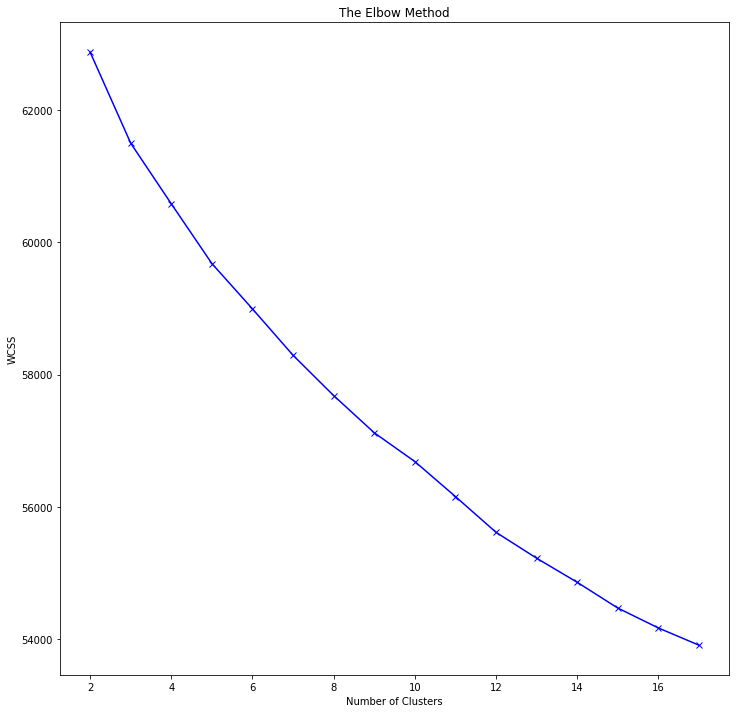

In [ ]:
plt.figure(figsize = (12,12))
plt.plot(range(2,18),wcss ,'bx-')
plt.title('The Elbow Method')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.show()

## Optimal number of clusters from elbow is n = 9

In [ ]:
kmeans = KMeans(n_clusters=9).fit(array)
centroids = kmeans.cluster_centers_
# print(centroids)
y = KMeans(n_clusters=9).fit_predict(array)


In [ ]:
from collections import Counter
# 

Let's see the Word Clouds for clusters.

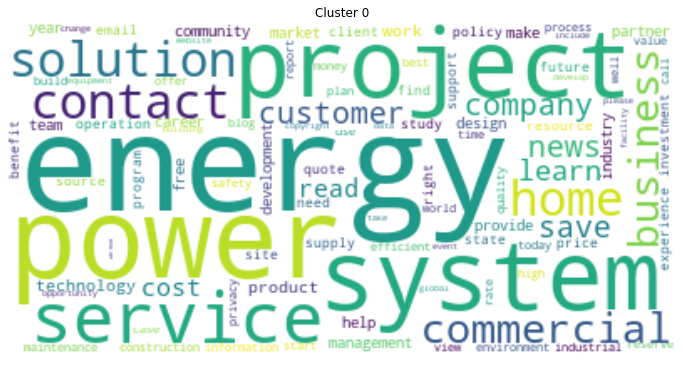

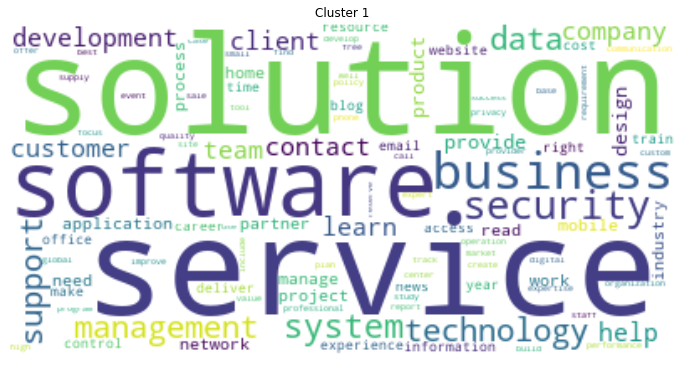

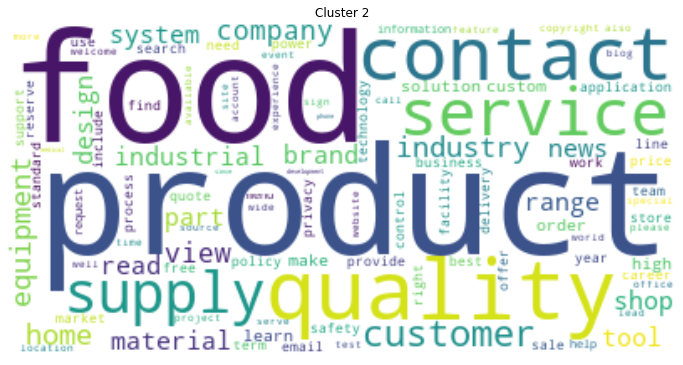

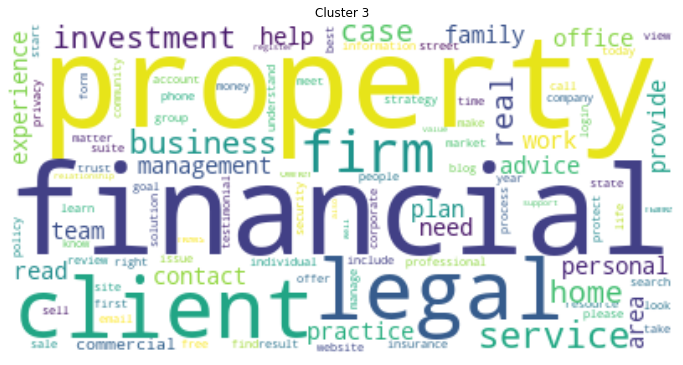

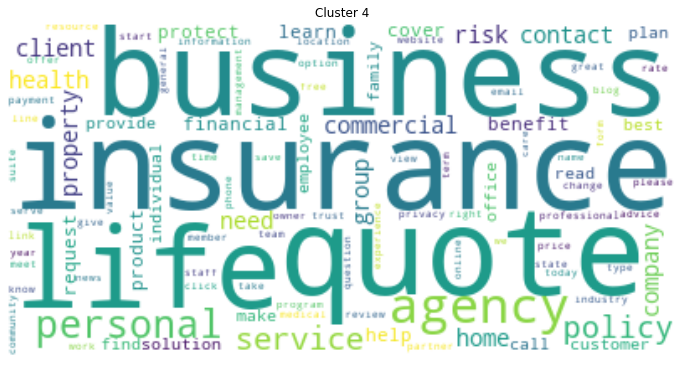

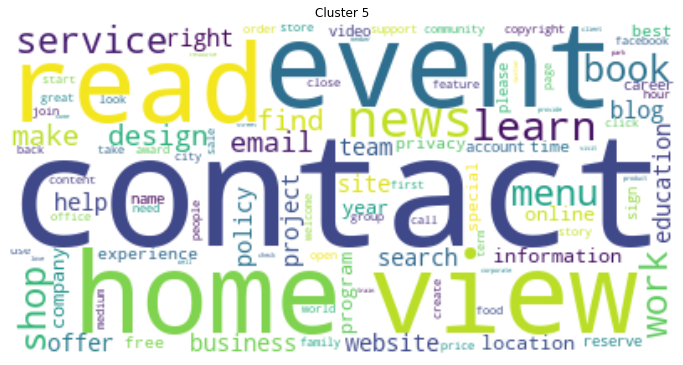

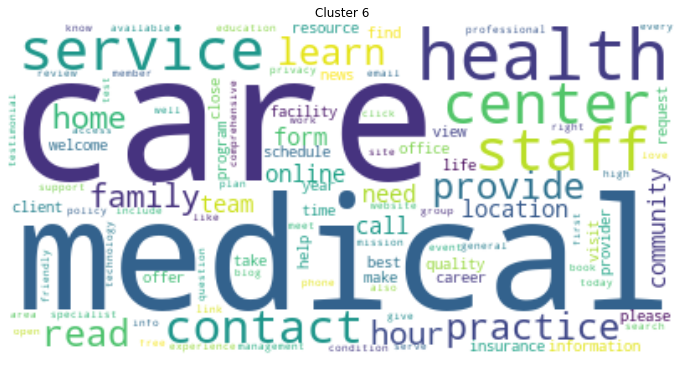

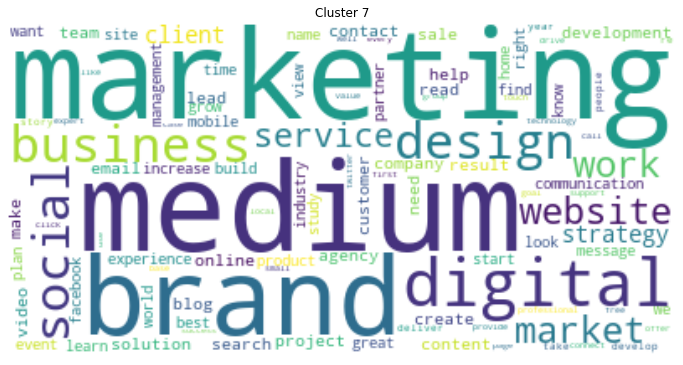

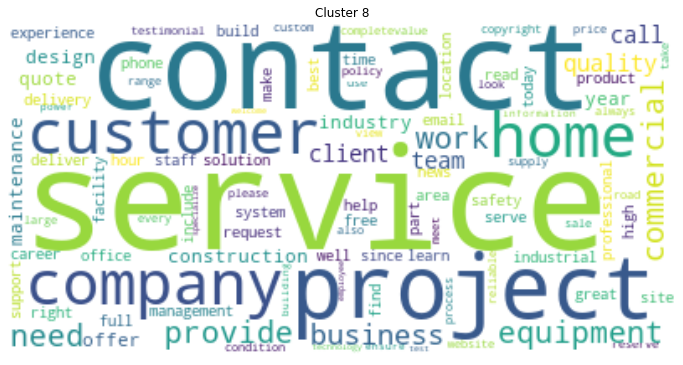

In [ ]:
order_centroids = kmeans.cluster_centers_.argsort()[:, ::-1]
terms = tfid_vectorizer.get_feature_names()
for i in range(9):
    words = [terms[ind] for ind in order_centroids[i, :]]
    words_ = Counter(words)
    # print("Cluster {}: {}".format(i, ' '.join(words)))
    
    wordcloud = WordCloud(background_color="white", max_words=100).generate_from_frequencies(words_)

    plt.figure(figsize = (12,12))
    plt.title('Cluster {}'.format(i))
    plt.imshow(wordcloud,interpolation="bilinear")
    plt.axis("off")
    plt.show()

### Word Clouds for homepage_text column

Cluster 0

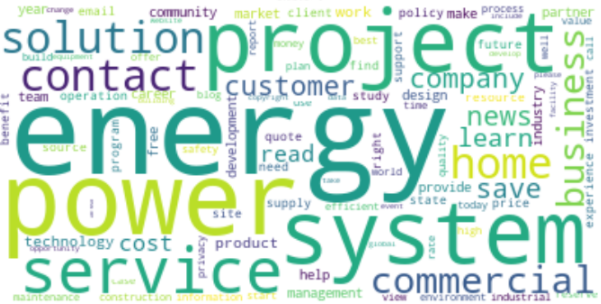


Cluster 1

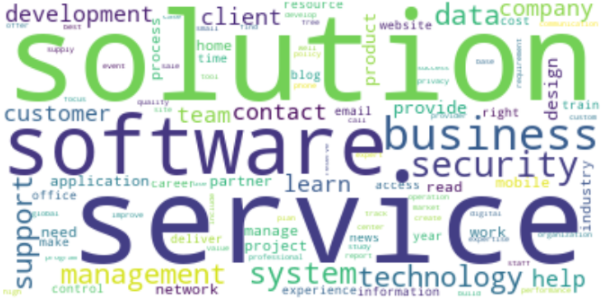

Cluster 2

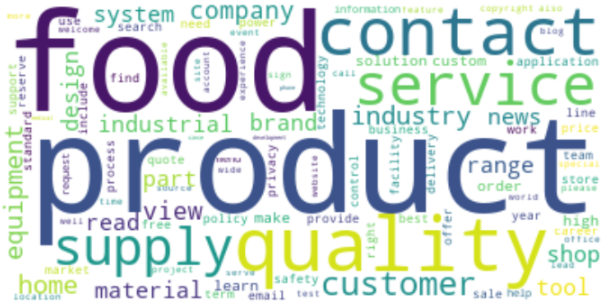

Cluster 3

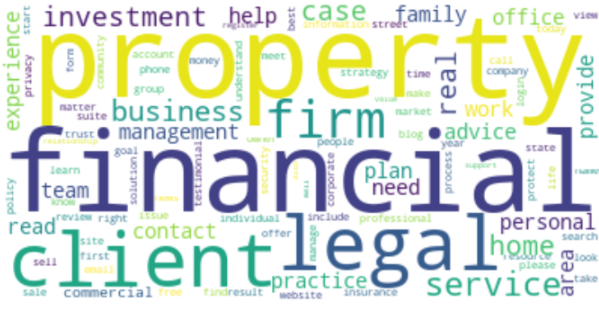

Cluster 4

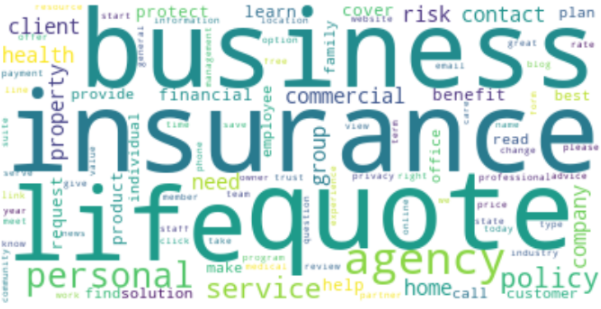

Cluster 5

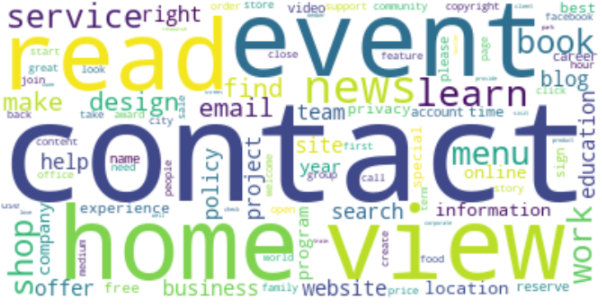

Cluster 6

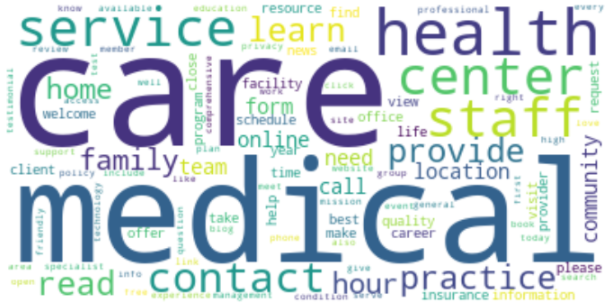

Cluster 7

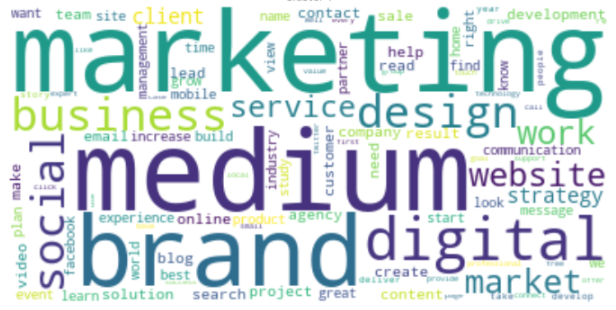

Cluster 8

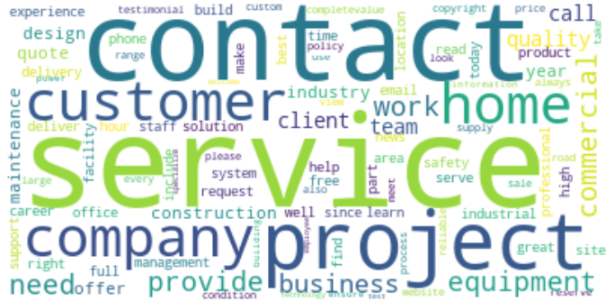

In [ ]:
name_of_cluster = {0 : "Energy Resources" ,  1:"Information Technology", 2 : "Food Deliviery Services" , 3: "Real Estates " , 4: "Insurance" , 5: "Event Management" , 6: "Healthcare" , 7: "Digital Marketing" , 8:"Home Services"}

In [ ]:
df_name = pd.DataFrame(list(name_of_cluster.items()),columns = ['cluster','name_of_cluster']).sort_values(by = 'cluster')
df_name

,cluster,name_of_cluster
0,0,Energy Resources
1,1,Information Technology
2,2,Food Deliviery Services
3,3,Real Estates
4,4,Insurance
5,5,Event Management
6,6,Healthcare
7,7,Digital Marketing
8,8,Home Services


In [ ]:
df1 = df_['homepage_text']

In [ ]:
df1["cluster_name"] = df1["cluster"].map(name_of_cluster)


In [ ]:
df1.head()

,homepage_text,cluster,cluster_name
0,electrician electrical contractor serve vero b...,7,Digital Marketing
1,site español elias medical home skin care acne...,4,Insurance
2,home garage door repair service designadoor ga...,7,Digital Marketing
3,type size home practice service patient form c...,4,Insurance
4,simply fill form back touch arrange free oblig...,1,Information Technology


In [ ]:
df1["cluster_name"].value_counts()


Food Deliviery Services    22445
Digital Marketing          16148
Energy Resources            8728
Information Technology      8010
Insurance                   5086
Healthcare                  4083
Home Services               3401
Real Estates                2948
Event Management            2456
Name: cluster_name, dtype: int64

In [ ]:
df1["cluster_name"].value_counts().index


Index(['Food Deliviery Services', 'Digital Marketing', 'Energy Resources',
       'Information Technology', 'Insurance', 'Healthcare', 'Home Services',
       'Real Estates ', 'Event Management'],
      dtype='object')

Distribution of all clusters in data

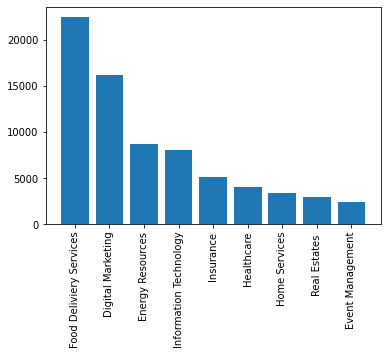

In [ ]:
plt.xticks(rotation=90)
plt.bar(list(df1['cluster_name'].value_counts().index), list(df1['cluster_name'].value_counts().values))
plt.show()

# Analysis on 'meta_keywords' and 'meta_description' columns

In [ ]:

df1 = df[['company_name','meta_keywords','meta_description']]

In [ ]:
# Merging two coulums
df1['text'] = df1['meta_keywords'] + df1['meta_description']

In [ ]:
df2 = df1[~df1['text'].isnull()]

In [ ]:
df2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22610 entries, 0 to 73970
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   company_name      22610 non-null  object
 1   meta_keywords     22610 non-null  object
 2   meta_description  22610 non-null  object
 3   text              22610 non-null  object
dtypes: object(4)
memory usage: 883.2+ KB


In [ ]:
df2.head()

,company_name,meta_keywords,meta_description,text
0,bip dipietro electric inc,"electricians vero beach, vero beach electrical...","Providing quality, reliable full service resid...","electricians vero beach, vero beach electrical..."
1,elias medical,Elias Medical bakersfield ca family doctor med...,For the best value in Bakersfield skin care tr...,Elias Medical bakersfield ca family doctor med...
2,koops overhead doors,"Koops Overhead Doors, Albany Garage Doors, Tro...","Koops Overhead Doors specializes in the sales,...","Koops Overhead Doors, Albany Garage Doors, Tro..."
5,wood green timber company limited,"wood, green, timber",Wood Green London Timber | Timber Merchants | ...,"wood, green, timberWood Green London Timber | ..."
6,houston chemical,"Chemicals, Drilling Fluids, Eco-Friendly, Envi...","Oilfield Chemicals - Production & Completion, ...","Chemicals, Drilling Fluids, Eco-Friendly, Envi..."


In [ ]:
df2.shape

(22610, 4)

In [ ]:
# creating vectorizer 
vectorizer = TfidfVectorizer(max_df=0.9, min_df=0.03)

In [ ]:
X = vectorizer.fit_transform(df2['text'])

In [ ]:
words_list = vectorizer.get_feature_names()

In [ ]:
tf_idf = pd.DataFrame(data = X.toarray(), columns=vectorizer.get_feature_names())

In [ ]:
tf_idf.head()

,agency,area,based,best,business,call,care,city,client,commercial,company,construction,consulting,corporate,county,custom,customer,design,development,energy,equipment,estate,experience,family,financial,firm,food,free,full,group,health,help,high,home,hospital,inc,including,india,industrial,industry,...,online,our,personal,planning,product,professional,project,property,provide,provider,provides,providing,quality,range,real,repair,residential,sale,service,services,serving,small,software,solution,solutions,south,supply,support,system,technology,the,today,top,training,uk,we,web,website,work,year
0,0.0,0.000000,0.0,0.000000,0.194974,0.0,0.000000,0.0,0.0,0.458655,0.0,0.0,0.0,0.0,0.60661,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.291139,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.249473,0.0,0.0,0.000000,0.298087,0.000000,0.305866,0.0,0.0,0.0,0.0,0.232888,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.000000,0.0,0.184349,0.000000,0.0,0.615295,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.441597,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.344581,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.778599,0.000000,0.370266,0.198600,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.00000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


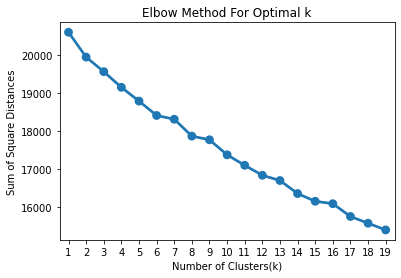

In [ ]:

from sklearn.cluster import KMeans

sum_of_sq_dist = {}
for k in range(1,20):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(X)
    sum_of_sq_dist[k] = km.inertia_
    
#Plot the graph for the sum of square distance values and Number of Clusters
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k')
plt.show()

For n_clusters = 2 The average silhouette_score is : 0.04645200045958926
For n_clusters = 3 The average silhouette_score is : 0.0436854809676941
For n_clusters = 4 The average silhouette_score is : 0.054136123329009016
For n_clusters = 5 The average silhouette_score is : 0.06092305690464549
For n_clusters = 6 The average silhouette_score is : 0.06675225043451406
For n_clusters = 7 The average silhouette_score is : 0.07178592102831134
For n_clusters = 8 The average silhouette_score is : 0.07992479797854747
For n_clusters = 9 The average silhouette_score is : 0.07928389001994038
For n_clusters = 10 The average silhouette_score is : 0.08427152134119865
For n_clusters = 11 The average silhouette_score is : 0.08980375869247084
For n_clusters = 12 The average silhouette_score is : 0.09506016268042851
For n_clusters = 13 The average silhouette_score is : 0.0996292667556727
For n_clusters = 14 The average silhouette_score is : 0.10490123503491149
For n_clusters = 15 The average silhouette_scor

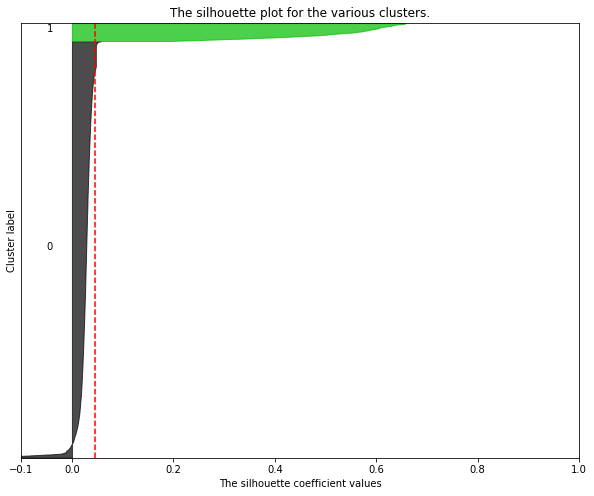

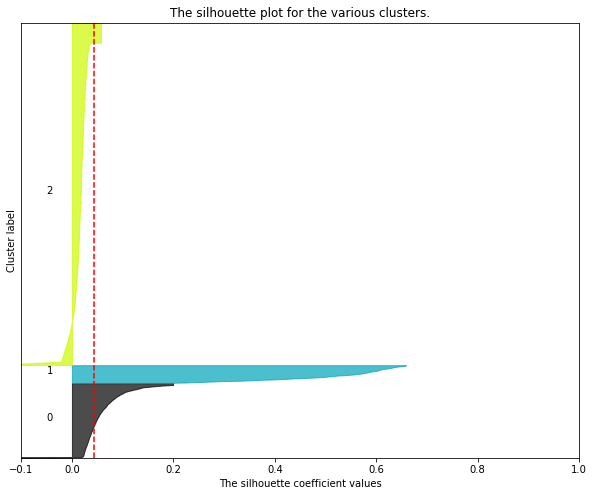

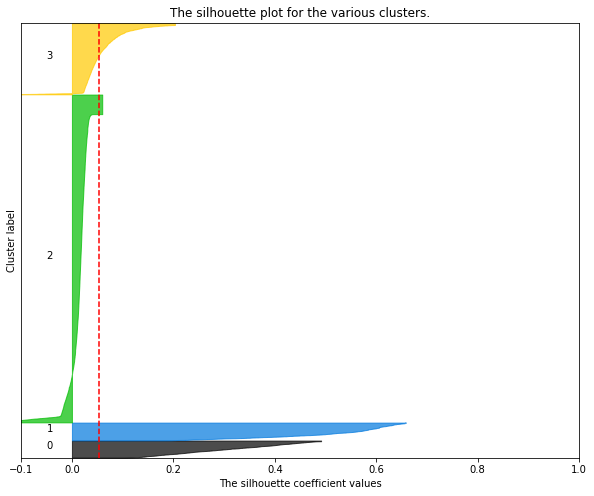

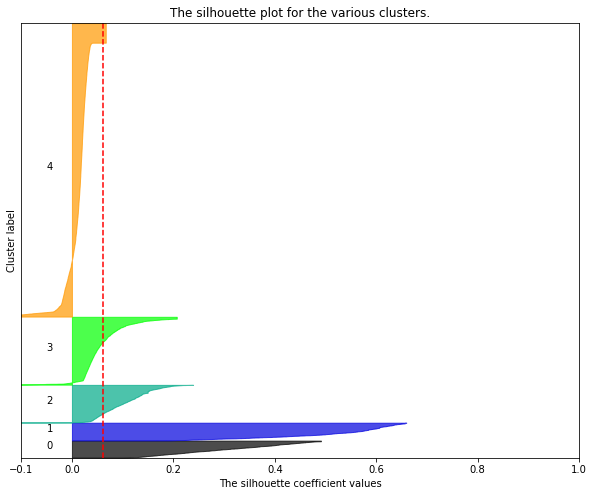

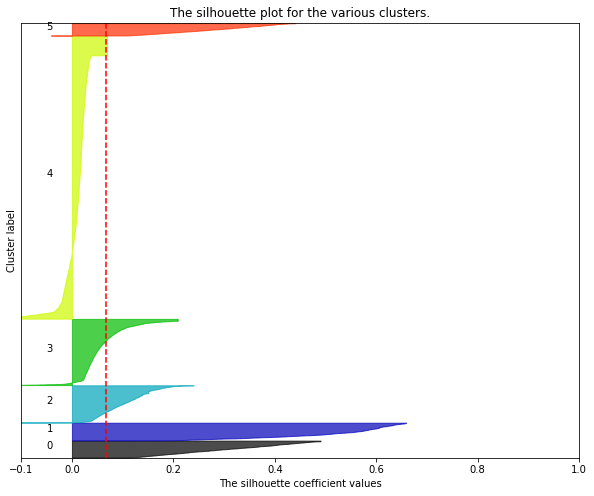

...

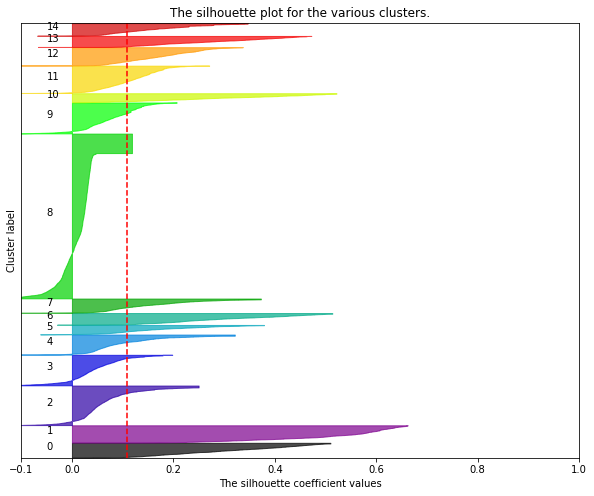

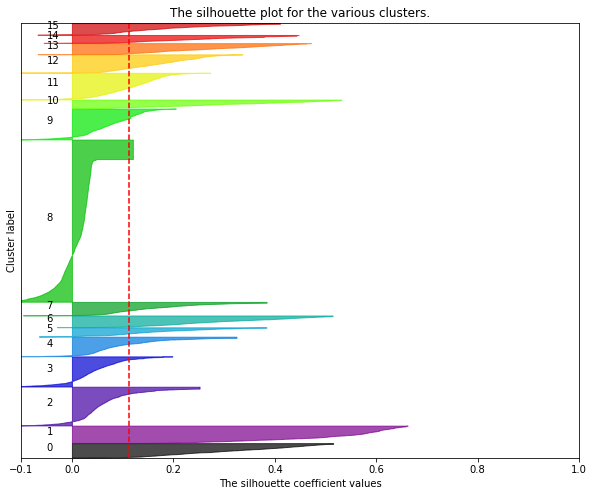

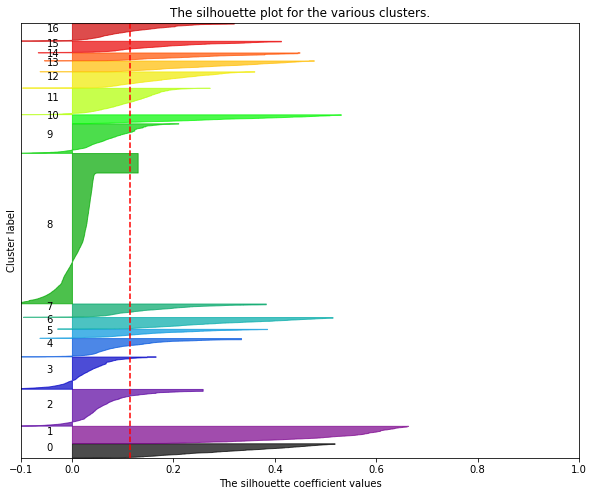

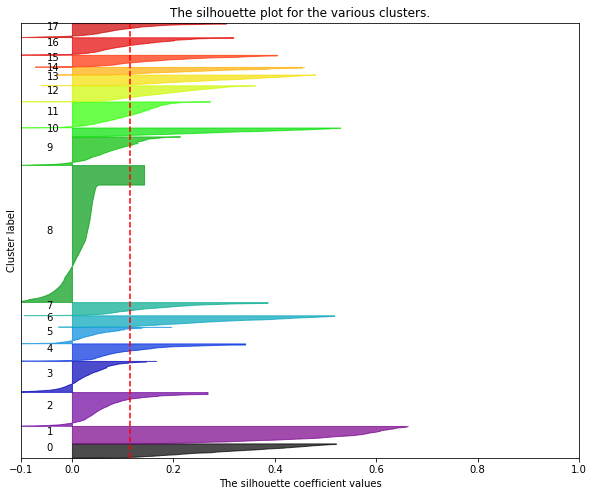

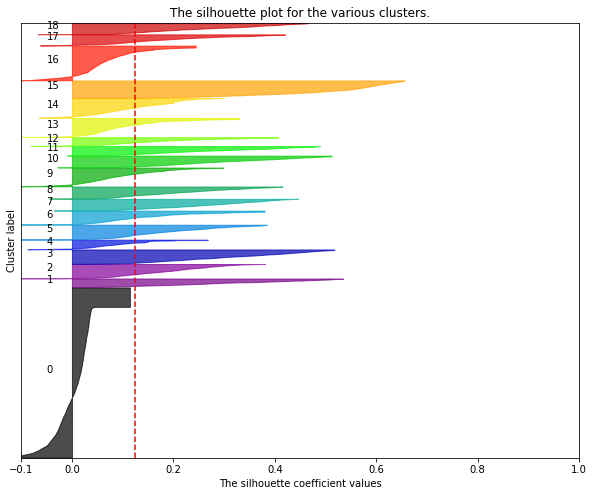

In [ ]:


from sklearn.metrics import silhouette_score
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score

import matplotlib.pyplot as plt
import matplotlib.cm as cm
import numpy as np

range_n_clusters = range(2,20)

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, (ax1) = plt.subplots(1)
    fig.set_size_inches(10, 8)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, X.shape[0] + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()

Looking at the graphs making 9 clusters.

In [ ]:
#Perform K-Mean Clustering or build the K-Means clustering model
KMean_clust = KMeans(n_clusters= 9, init= 'k-means++', max_iter= 1000)
KMean_clust.fit(X)

#Find the clusters for the observation given in the dataset
df2['Cluster'] = KMean_clust.labels_
df2.head(10)

,company_name,meta_keywords,meta_description,text,Cluster
0,bip dipietro electric inc,"electricians vero beach, vero beach electrical...","Providing quality, reliable full service resid...",electrician vero beach vero beach electrical c...,7
1,elias medical,Elias Medical bakersfield ca family doctor med...,For the best value in Bakersfield skin care tr...,Elias Medical bakersfield ca family doctor med...,8
2,koops overhead doors,"Koops Overhead Doors, Albany Garage Doors, Tro...","Koops Overhead Doors specializes in the sales,...",Koops Overhead Doors Albany Garage Doors Troy ...,7
5,wood green timber company limited,"wood, green, timber",Wood Green London Timber | Timber Merchants | ...,wood green timberWood Green London Timber Timb...,6
6,houston chemical,"Chemicals, Drilling Fluids, Eco-Friendly, Envi...","Oilfield Chemicals - Production & Completion, ...",Chemicals Drilling Fluids EcoFriendly Environm...,6
8,pespisa company plumbing and heating,"high efficiency boiler,plumbing professionals,...","Plumbing, Heating, Ductless Air Conditioning, ...",high efficiency boilerplumbing professionalsai...,6
9,"metal pride, inc.","UL Certified, brake metal, break metal fabrica...","Metal Pride Inc. is a 50,000 square foot sheet...",UL Certified brake metal break metal fabricati...,7
16,durabond janitorial services,"commercial cleaning toronto, commercial cleani...","When you need commercial cleaning in Toronto, ...",commercial cleaning toronto commercial cleanin...,6
20,franklin electric company,"Magento, Varien, E-commerce",Franklin-Griffith offers electrical supplies a...,Magento Varien EcommerceFranklinGriffith offer...,6
29,oregon office solutions,"Copiers, Xerox Copiers, Office Equipment, Lase...","At Oregon Office Solutions, we pride ourselves...",Copiers Xerox Copiers Office Equipment Laser P...,6


In [ ]:
labels = KMean_clust.labels_

In [ ]:
order_centroids = KMean_clust.cluster_centers_.argsort()

Let's look at the word clouds now.

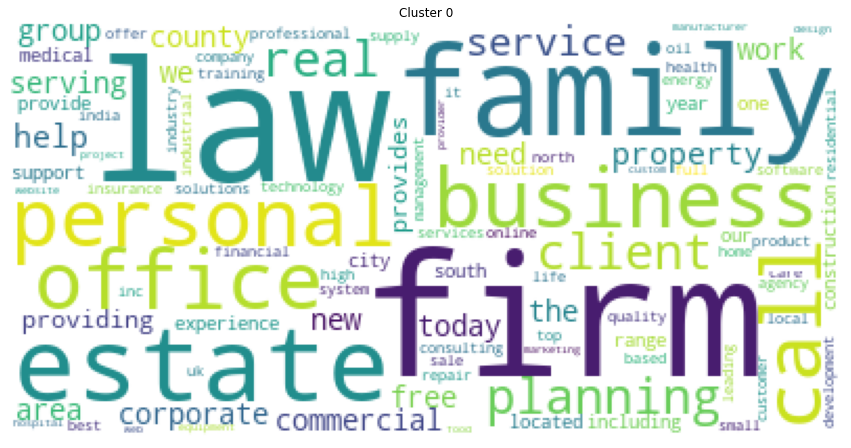

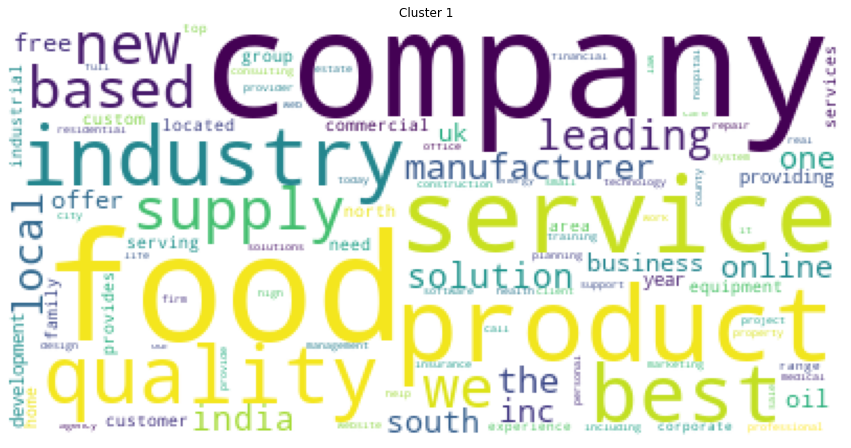

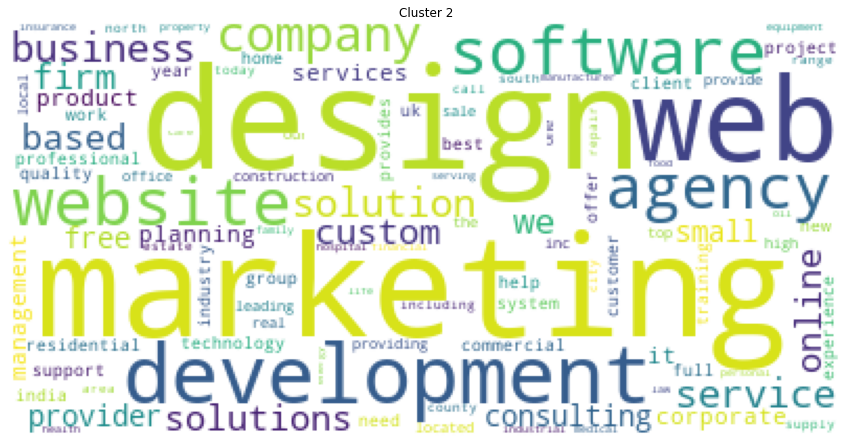

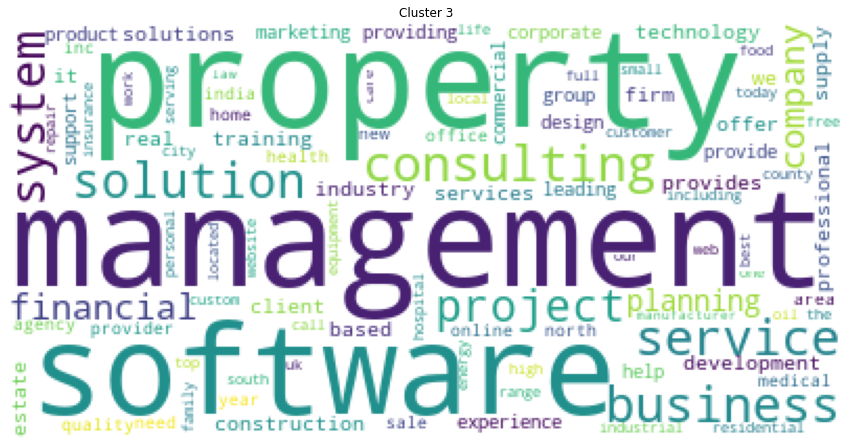

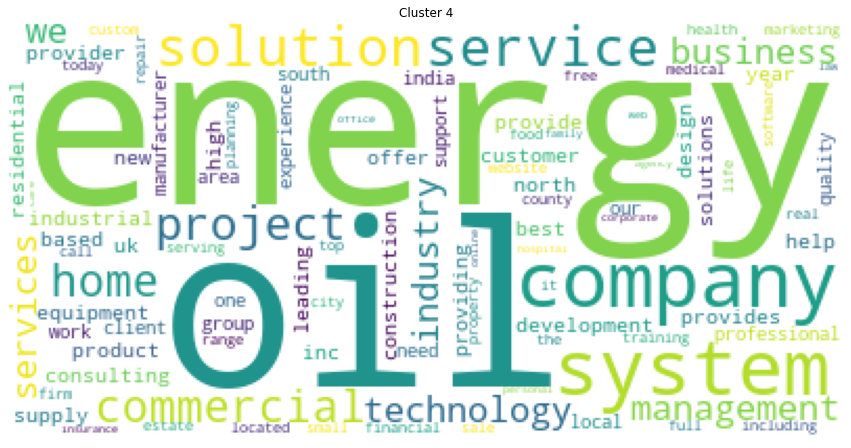

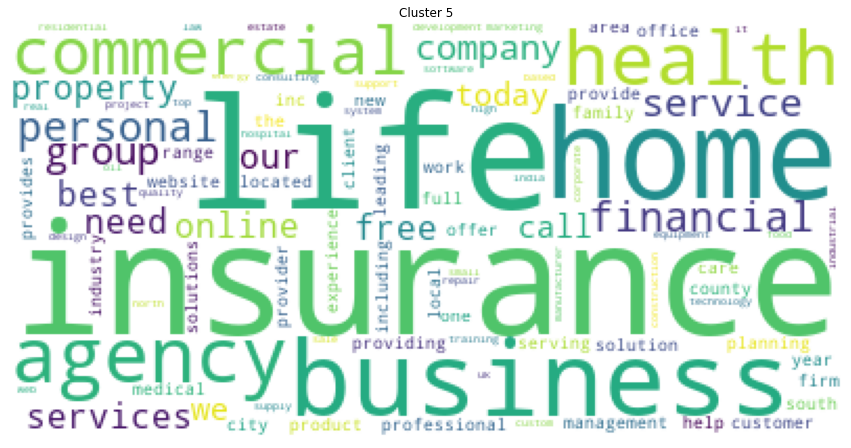

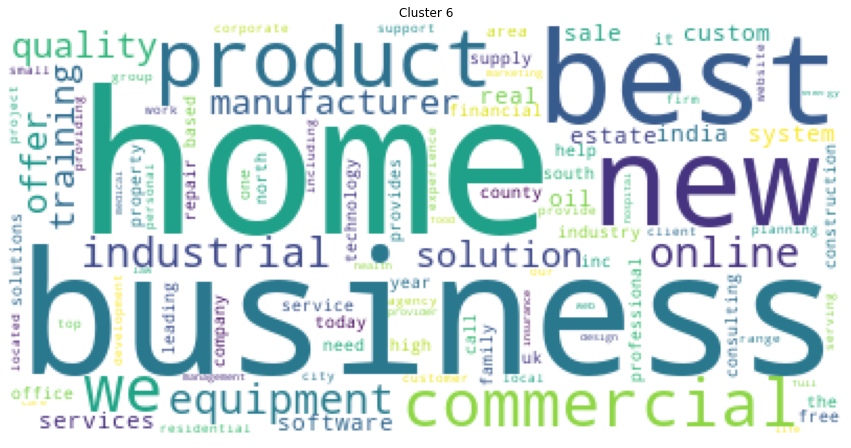

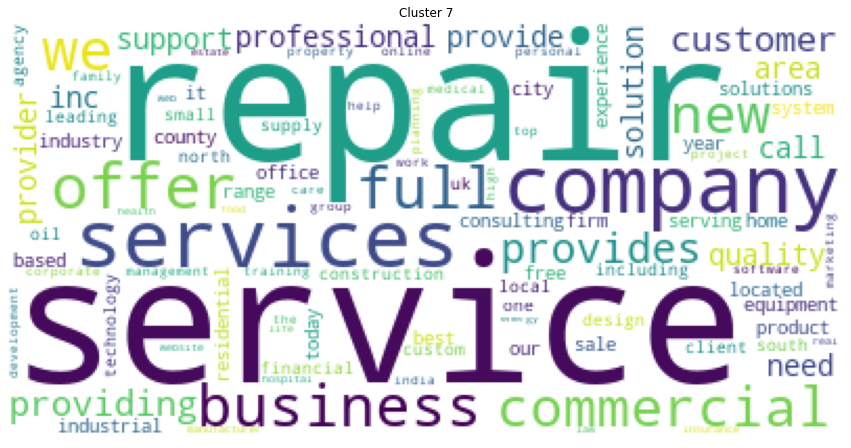

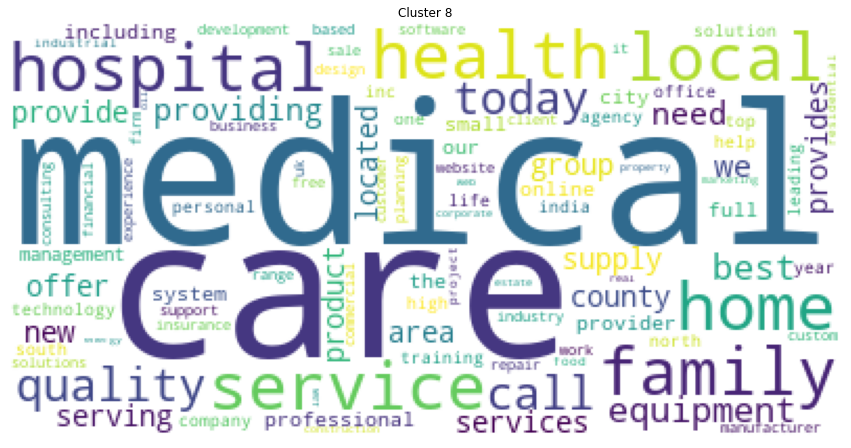

In [ ]:
order_centroids = KMean_clust.cluster_centers_.argsort()[:, ::-1]
for i in range(9):
    words = [words_list[ind] for ind in order_centroids[i, :]]
    words_ = Counter(words)
    # print("Cluster {}: {}".format(i, ' '.join(words)))
    # print(f'words in cluster {i} are {words}')
    # print(f'Length of words in cluster {i} is {len(words)}')
    
    wordcloud = WordCloud(background_color="white", max_words=100).generate_from_frequencies(words_)
    # plt.imshow(wordcloud)
    plt.figure(figsize = (15,15))
    plt.title('Cluster {}'.format(i))
    plt.imshow(wordcloud)
    plt.axis("off")
    plt.show()

In [ ]:
a = KMean_clust.labels_
mapping = {0:'Legal Services', 1:'Food Manufacturing',2:'IT Services' ,3:'Real Estate',4:'Oil and Energy',5:'Health Insurance',6:'Home Equipment Manufacturer',7:'Repair Services',8:'Medical Equipemt Manufacturer'}
a = [mapping[i] for i in a]


In [ ]:
df2['Cluster'] = a

In [ ]:
df2.head()

,company_name,meta_keywords,meta_description,text,Cluster
0,bip dipietro electric inc,"electricians vero beach, vero beach electrical...","Providing quality, reliable full service resid...",electrician vero beach vero beach electrical c...,IT Services
1,elias medical,Elias Medical bakersfield ca family doctor med...,For the best value in Bakersfield skin care tr...,Elias Medical bakersfield ca family doctor med...,IT Services
2,koops overhead doors,"Koops Overhead Doors, Albany Garage Doors, Tro...","Koops Overhead Doors specializes in the sales,...",Koops Overhead Doors Albany Garage Doors Troy ...,Oil and Energy
5,wood green timber company limited,"wood, green, timber",Wood Green London Timber | Timber Merchants | ...,wood green timberWood Green London Timber Timb...,IT Services
6,houston chemical,"Chemicals, Drilling Fluids, Eco-Friendly, Envi...","Oilfield Chemicals - Production & Completion, ...",Chemicals Drilling Fluids EcoFriendly Environm...,Legal Services


In [ ]:
words = vectorizer3.get_feature_names()
common_words = KMean_clust.cluster_centers_.argsort()[:,-1:-15:-1]
for num, centroid in enumerate(common_words):
    print(str(num) + ' : ' + ', '.join(words[word] for word in centroid))

0 : management, law, financial, consulting, firm, business, planning, service, software, solution, personal, services, client, family, system, company, project, help, office
1 : company, best, home, business, new, we, product, online, solution, quality, medical, offer, commercial, software, training, system, custom, oil, services
2 : property, estate, real, home, sale, management, commercial, residential, law, service, business, new, company, area, county, office, development, planning, city
3 : design, marketing, web, development, website, software, agency, company, business, service, solution, solutions, based, custom, we, management, online, firm, free
4 : service, company, repair, services, offer, commercial, we, business, new, full, provides, providing, customer, professional, area, provide, provider, quality, call
5 : energy, food, oil, company, system, product, service, industry, solution, home, project, commercial, technology, management, business, we, quality, leading, uk
6 : 

In [ ]:
cluster_0 = df2[df2.Cluster == 0]

In [ ]:
cluster_1 = df2[df2.Cluster == 1]

In [ ]:
cluster_2 = df2[df2.Cluster == 2]

In [ ]:
cluster_3 = df2[df2.Cluster == 3]

In [ ]:
cluster_4 = df2[df2.Cluster == 4]

# Example senteces in each cluster

In [ ]:
cluster_0['text'][:5]

0     electrician vero beach vero beach electrical c...
2     Koops Overhead Doors Albany Garage Doors Troy ...
9     UL Certified brake metal break metal fabricati...
41    McMurdie Electrical Portdown offer wide range ...
59    victoryfundingmortgageloanfinancingcommercialr...
Name: text, dtype: object

In [ ]:
cluster_1['text'][:5]

280    wastemanagementfacilitiesrecyclinglandfillrubb...
307    Investment Capital management Cavendish specia...
390    Burglar Alarms Dudley Commercial CCTV West Mid...
392    KEM EMS Environmental Management Systems Asbes...
446    Facilities Management Consultant ME Engineerin...
Name: text, dtype: object

In [ ]:
cluster_2['text'][:5]

84     CCTV fire alarm fire detection intrusion detec...
85     real estate tyler texas real estate east texas...
223    purdy contract building service contractor com...
480    real estate crowdfunding property investing re...
571    Mobile Banking Mortgage Commercial Real Estate...
Name: text, dtype: object

In [ ]:
cluster_3['text'][:5]

5     wood green timberWood Green London Timber Timb...
6     Chemicals Drilling Fluids EcoFriendly Environm...
8     high efficiency boilerplumbing professionalsai...
16    commercial cleaning toronto commercial cleanin...
20    Magento Varien EcommerceFranklinGriffith offer...
Name: text, dtype: object

In [ ]:
cluster_4['text'][:5]

428     solar energy solar installers near solar insta...
1294    Servo Stabilizer Servo Stabilizers Servo Stabi...
3171    brass neutral link brass neutral bar brass ear...
3810    byram lab testing measurement electrical elste...
4318    global energy metal cobalt Werner Lake Cobalt ...
Name: text, dtype: object

In [ ]:
company_count_in_cluster = df2['Cluster'].value_counts()

In [ ]:
df_cluster = pd.DataFrame(company_count_in_cluster)

In [ ]:
df_cluster.reset_index(level=0, inplace=True)

In [ ]:
df_cluster

,index,Cluster
0,IT Services,15957
1,Health Insurance,1319
2,Real Estate,978
3,Food Manufacturing,920
4,Medical Equipemt Manufacturer,919
5,Repair Services,792
6,Home Equipment Manufacturer,625
7,Oil and Energy,595
8,Legal Services,503


/usr/local/lib/python3.7/dist-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


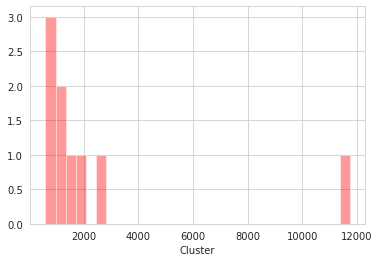

In [ ]:
import seaborn as sns

sns.set_style('whitegrid')
sns.distplot(company_count_in_cluster, kde = False, color ='red', bins = 30)

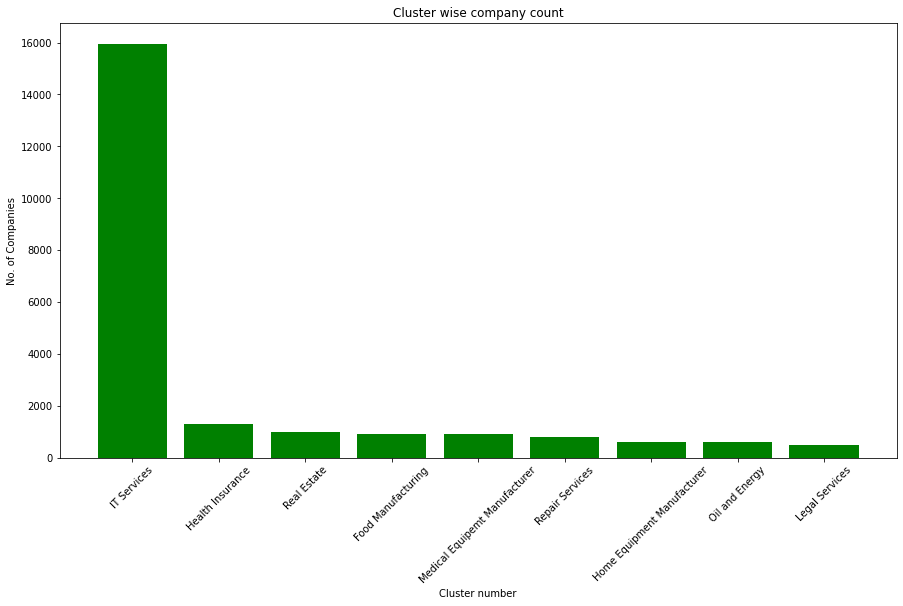

In [ ]:
fig = plt.figure(figsize = (15, 8))
 
# creating the bar plot
plt.bar(df_cluster['index'],df_cluster['Cluster'], color ='Green',
        width = 0.8)
 
plt.xlabel("Cluster number")
plt.ylabel("No. of Companies")
plt.title("Cluster wise company count")
plt.xticks(rotation=45)

plt.show()

# Analysis on Headings (combination on H1, H2, H3)

In [ ]:
# Checking head of df

df.head()

,website,company_name,homepage_text,h1,h2,h3,nav_link_text,meta_keywords,meta_description
0,bipelectric.com,bip dipietro electric inc,Electrici...,NaN,NaN,NaN,NaN,"electricians vero beach, vero beach electrical...","Providing quality, reliable full service resid..."
1,eliasmedical.com,elias medical,site map | en español Elias Medical h...,Offering Bakersfield family medical care from ...,Welcome to ELIAS MEDICAL#sep#Family Medical Pr...,Get To Know Elias Medical#sep#Family Medical P...,NaN,Elias Medical bakersfield ca family doctor med...,For the best value in Bakersfield skin care tr...
2,koopsoverheaddoors.com,koops overhead doors,Home About Us Garage Door Repair & Servi...,NaN,Customer Reviews#sep#Welcome to Koops Overhead...,NaN,NaN,"Koops Overhead Doors, Albany Garage Doors, Tro...","Koops Overhead Doors specializes in the sales,..."
3,midtowneyes.com,midtown eyecare,918-599-0202 Type Size...,NaN,Welcome to our practice!,NaN,NaN,NaN,We would like to welcome you to Midtown Eyecar...
4,reprosecurity.co.uk,repro security ltd,Simply fill out our form below...,NaN,Welcome to REPRO SECURITY Ltd,NaN,NaN,NaN,Repro Security provide a range of tailor made ...


In [ ]:
# Constructing a df that will have headers only! (Will take company name as well for any reference)

df_headers = df[["company_name" , "h1" , "h2" , "h3"]]

In [ ]:
# Replacing null values with empty string (so that when we combine header, it won't screw up because of NaN)

df_headers = df_headers.fillna(" ")

**Vectorization**

In [ ]:
dfh["headers"].values

array(['offer family medical care pediatrics geriatrics also offer skin care include laser skin treatment medical welcome medical family medical practice skin care schedule consultation know medical family medical practice consultation skin care',
       'customer review welcome overhead door',
       'wood green timber potter yard stock comprehensive selection timber suitable wide variety floor joist decorative stock ready take away delivery prefer maintain high stock level order satisfy building requirement immediately however equally happy source specialist requirement delivery collection later date location wood green opening hour location potter',
       ...,
       'beauty salon welcome spotlight specialist skin body beauty lymphatic drainage facial massage fear miss',
       'mobile hair artist across artist available location background help hair artist member team here client special occasion lesson head office popular service connect alison request call back party beauty call

In [ ]:
dfh.shape

(57367, 3)

In [ ]:
dfh.len.describe()

count    57367.000000
mean        27.659281
std         33.518728
min          5.000000
25%         11.000000
50%         19.000000
75%         34.000000
max       1872.000000
Name: len, dtype: float64

**TF-IDF**

In [ ]:
# Instantiating object of tfidf

vectorizer = TfidfVectorizer(min_df = 0.01 , use_idf=True)

In [ ]:
# Fitting & transforming

X = vectorizer.fit_transform(dfh["headers"])

In [ ]:
X.shape

(57367, 462)

##**Clustering**

###**K-Means**

In [ ]:
# Trying with default num of clusters 8

kmeans = KMeans(init="k-means++", random_state=42)

In [ ]:
kmeans.fit(X)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=8, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=42, tol=0.0001, verbose=0)

In [ ]:
unique, counts = np.unique(kmeans.labels_, return_counts=True)

In [ ]:
dict_data = dict(zip(unique, counts))
dict_data

{0: 2114, 1: 3504, 2: 1583, 3: 3133, 4: 1535, 5: 5114, 6: 9319, 7: 31065}

**Optimal K**

**1) Elbow Method**

In [ ]:
kmeans_kwargs = {"init": "k-means++", "n_init": 10, "max_iter": 500, "random_state": 42}

In [ ]:
# A list holds the SSE values for each k

wcss = []
for k in range(2, 21):
  kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
  kmeans.fit(X)
  wcss.append(kmeans.inertia_)

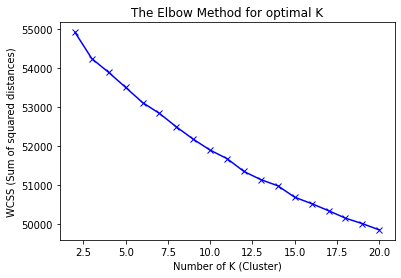

In [ ]:
# Plotting

plt.plot(range(2,21),wcss ,'bx-')
plt.title('The Elbow Method for optimal K')
plt.xlabel('Number of K (Cluster)')
plt.ylabel('WCSS (Sum of squared distances)')
plt.show()

##**We are not getting pure elbow curve but if we look closely we can take our optimal K (number of clusters) as "12"..**

In [ ]:
from yellowbrick.cluster import KElbowVisualizer , SilhouetteVisualizer
import warnings
warnings.filterwarnings("ignore")

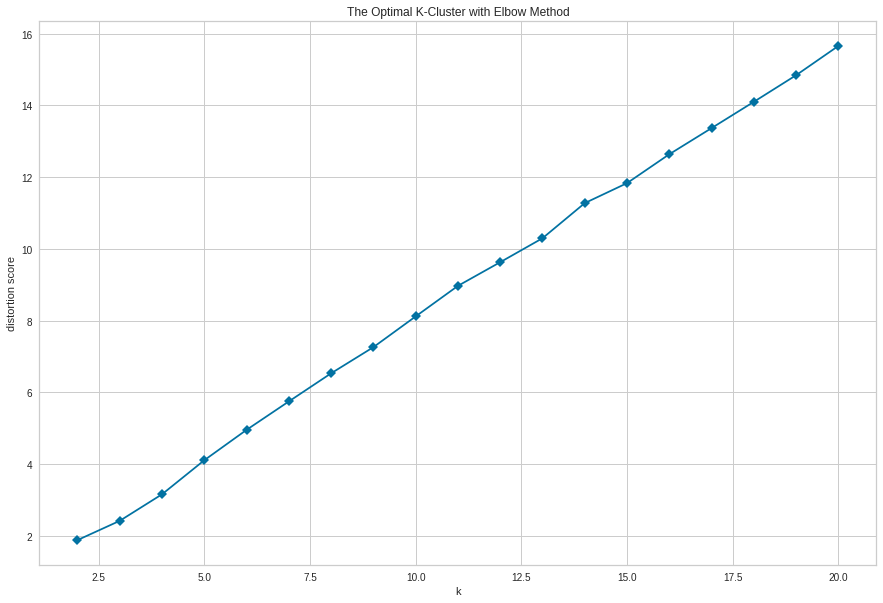

In [ ]:
# Plotting Distortion for different K's

kmeans = KMeans(random_state=42)

titleKElbow = "The Optimal K-Cluster with Elbow Method"
visualizer = KElbowVisualizer(kmeans, k=(2,21), metric= 'distortion', title = titleKElbow , timings= False,locate_elbow=True , size=(1080, 720))
visualizer.fit(X)
visualizer.poof()

In [ ]:
# Metric : Calinski Harabaz (Optimal K where Calinski Harabaz score is maximum)

titleKElbow = "The Optimal K-Cluster with Elbow Method"
visualizer = KElbowVisualizer(kmeans, k=(2,15), metric='calinski_harabaz', title = titleKElbow , timings= False,locate_elbow=True , size=(1080, 720))
visualizer.fit(X)
visualizer.poof()

In [ ]:
from sklearn.metrics import silhouette_score , silhouette_samples

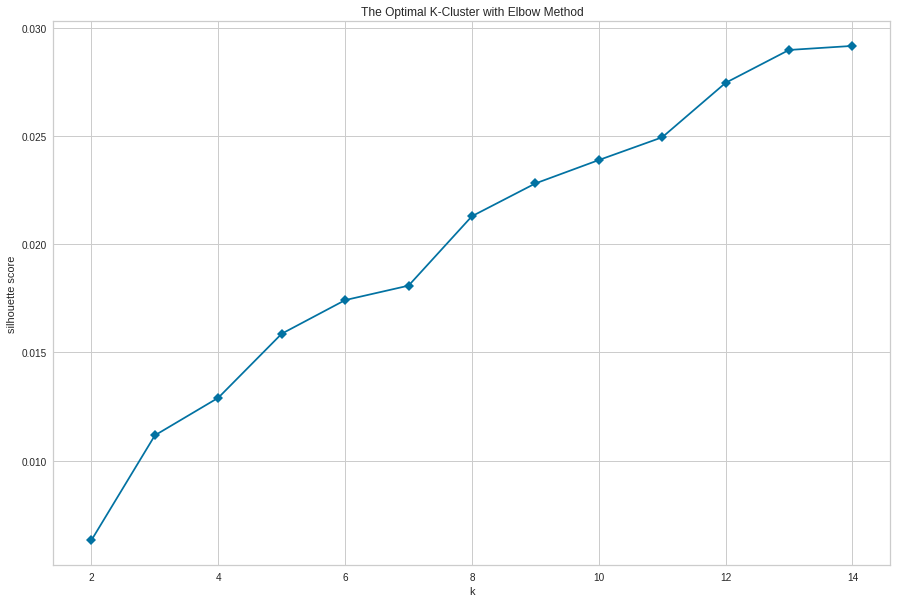

In [ ]:
# Metric: Silhoutte Score

titleKElbow = "The Optimal K-Cluster with Elbow Method"
visualizer = KElbowVisualizer(kmeans, k=(2,15), metric='silhouette', title = titleKElbow , timings= False,locate_elbow=True , size=(1080, 720))
visualizer.fit(X)
visualizer.poof()

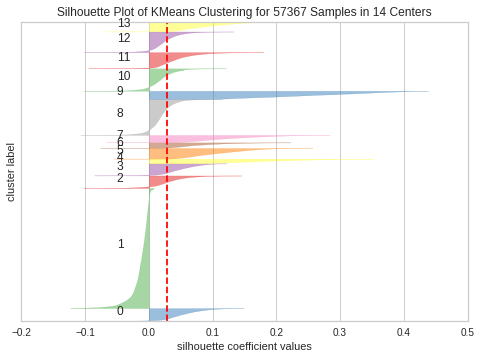

In [ ]:
# Alternate for visualizing silhoutte score

from yellowbrick.cluster import SilhouetteVisualizer

sil_visualizer = SilhouetteVisualizer(kmeans)
sil_visualizer.fit(X)    # Fit the data to the visualizer
sil_visualizer.poof()    # Draw/show/poof the data

##**So, we are heading with 12 number of clusters and will see how our word cloud will look like..**

**Labelling cluster based on true K**

In [ ]:
# Labelling clusters

true_k = 12
model = KMeans(n_clusters=true_k, init='k-means++', max_iter=200, n_init=10)
model.fit(X)
labels = model.labels_
header_cl = pd.DataFrame(list(zip(dfh["headers"],labels)),columns=['headers','cluster'])

In [ ]:
header_cl.head()

,headers,cluster
0,offer family medical care pediatrics geriatric...,6
1,customer review welcome overhead door,3
2,wood green timber potter yard stock comprehens...,3
3,opportunity doesnt knock build door chemical,3
4,twitter lead program news event target neurode...,10


In [ ]:
header_cl.cluster.value_counts()

3     25819
4      7768
9      6353
7      3219
6      3090
10     2374
11     2126
1      1891
5      1579
0      1503
2      1108
8       537
Name: cluster, dtype: int64

**Word Cloud for each cluster**

In [ ]:
from PIL import Image
import numpy as np

In [ ]:
text = []

for i in range(12):
    cluster_df = header_cl[header_cl['cluster']==i]
    text.append(' '.join(list(cluster_df['headers'])))

In [ ]:
# fucntion to create wordcloud

def word_cloud(text):
    wordcloud = WordCloud(max_font_size=50, max_words=100, background_color="white" , font_path=font_path , mask=mask , width=mask.shape[1], height=mask.shape[0]).generate(text)
    plt.figure(figsize=(10,10))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis("off")
    plt.show()

Word cloud for cluster 0


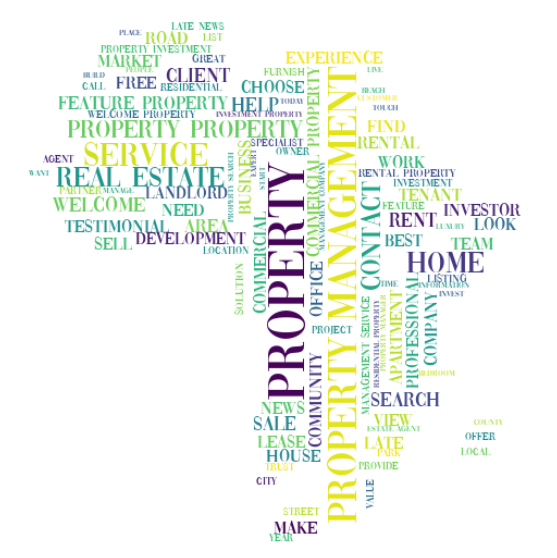

Word cloud for cluster 1


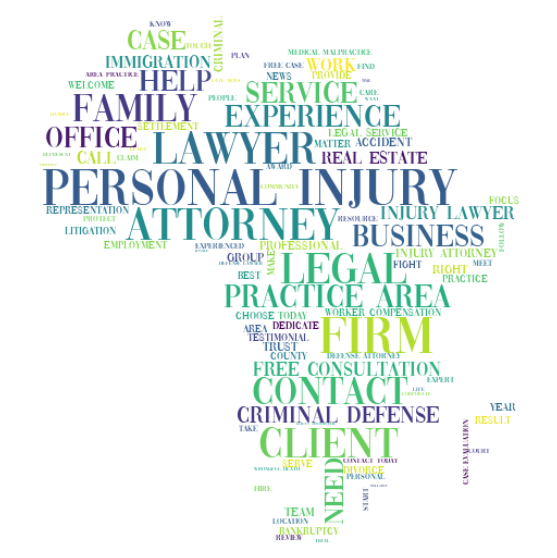

Word cloud for cluster 2


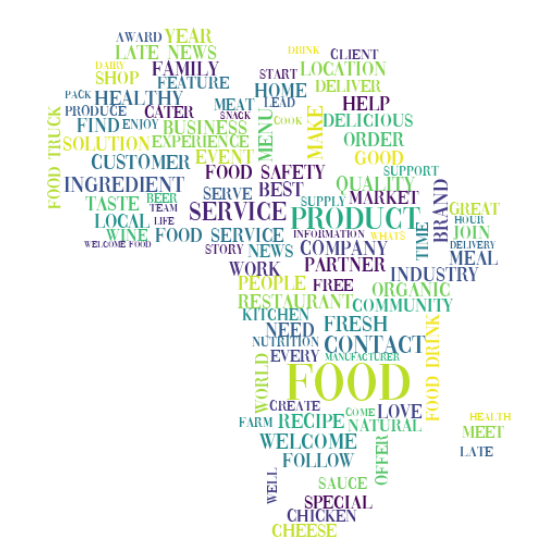

Word cloud for cluster 3


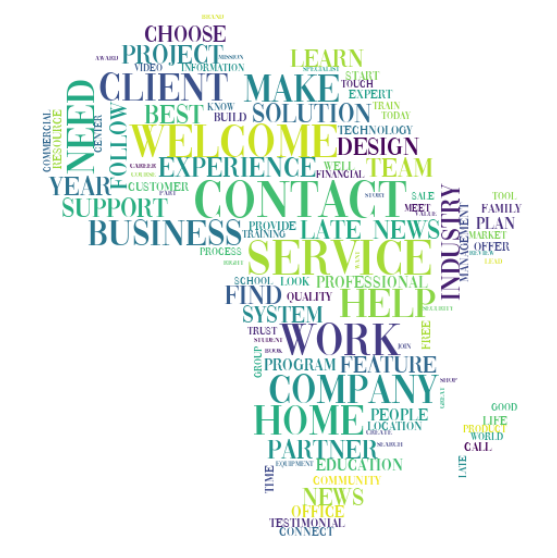

Word cloud for cluster 4


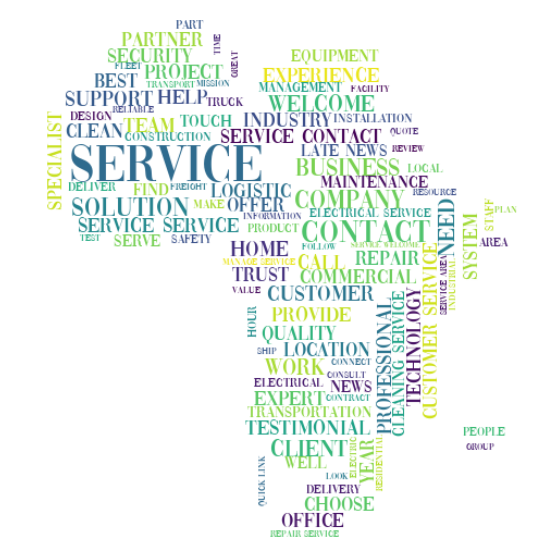

Word cloud for cluster 5


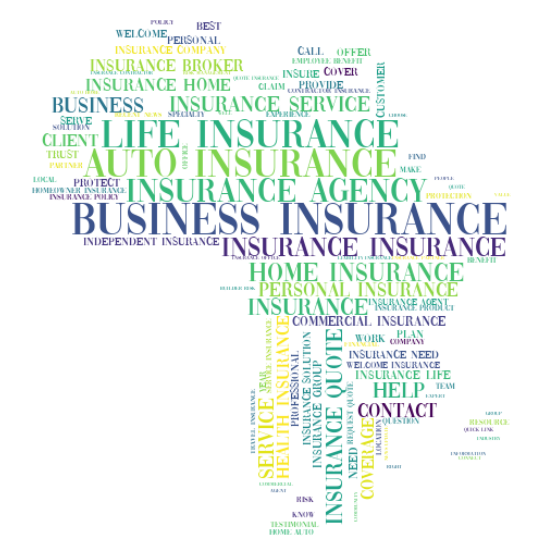

Word cloud for cluster 6


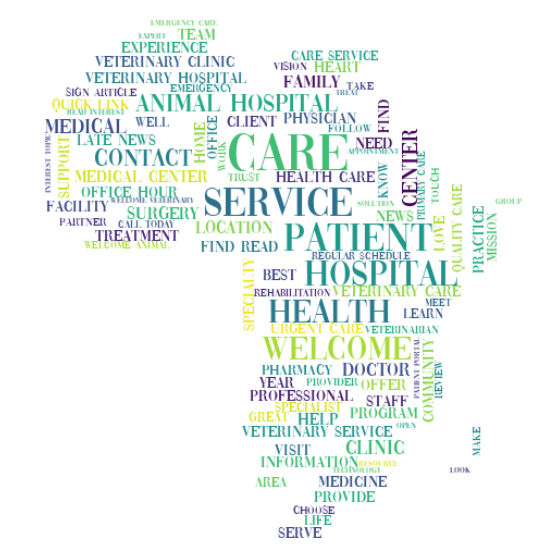

Word cloud for cluster 7


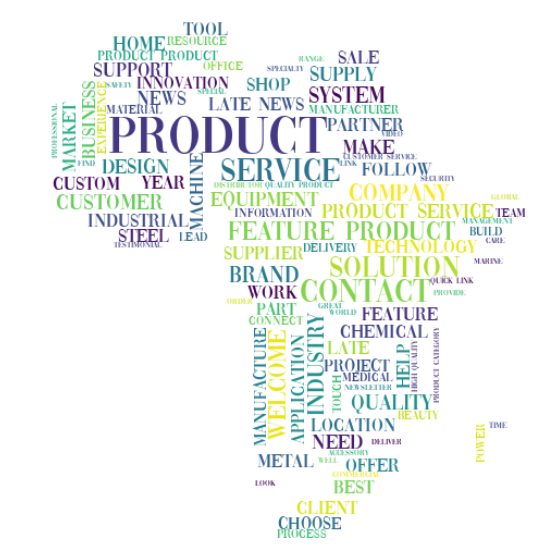

Word cloud for cluster 8


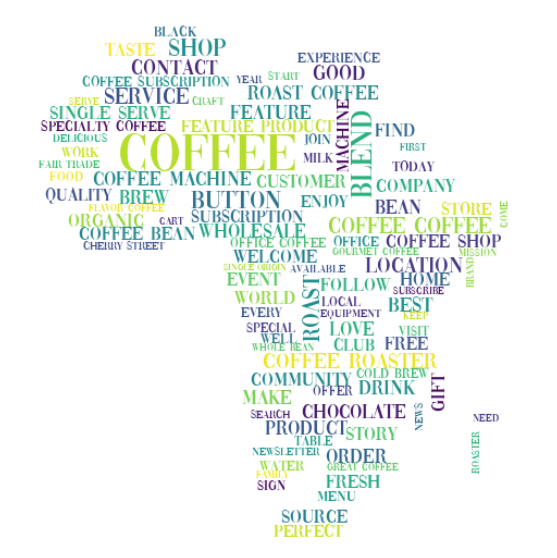

Word cloud for cluster 9


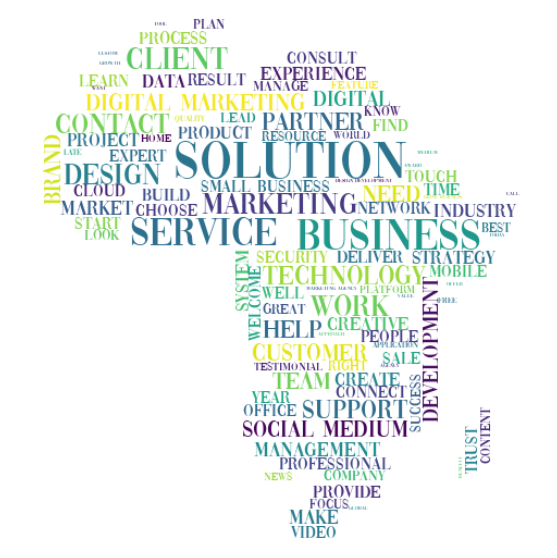

Word cloud for cluster 10


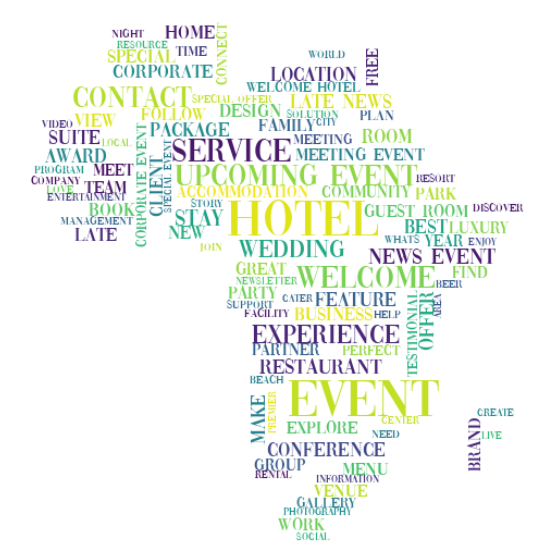

Word cloud for cluster 11


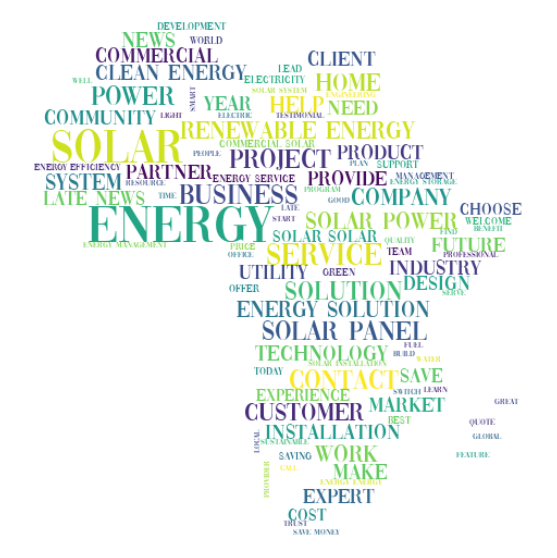

In [ ]:
# Printing word cloud

for i in range(12):
  print(f'Word cloud for cluster {i}')
  word_cloud(text[i])

#**Let's try TOPIC MODELING now and see what we get..**

In [ ]:
import numpy as np
import pandas as pd
from IPython.display import display
from tqdm import tqdm
from collections import Counter
import ast

import matplotlib.pyplot as plt
import matplotlib.mlab as mlab
import seaborn as sb

from sklearn.feature_extraction.text import CountVectorizer
from textblob import TextBlob
import scipy.stats as stats

from sklearn.decomposition import TruncatedSVD
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.manifold import TSNE

output_notebook()

%matplotlib inline

In [ ]:
# Reading data

path = "/content/drive/MyDrive/Almabetter/Capstone Project 2 (Company Classification)/DATA/preprocessed.csv"

d0 = pd.read_csv(path)

In [ ]:
# Define helper functions
def get_top_n_words(n_top_words, count_vectorizer, text_data):
    '''
    returns a tuple of the top n words in a sample and their 
    accompanying counts, given a CountVectorizer object and text sample
    '''
    vectorized_headlines = count_vectorizer.fit_transform(text_data.values)
    vectorized_total = np.sum(vectorized_headlines, axis=0)
    word_indices = np.flip(np.argsort(vectorized_total)[0,:], 1)
    word_values = np.flip(np.sort(vectorized_total)[0,:],1)
    
    word_vectors = np.zeros((n_top_words, vectorized_headlines.shape[1]))
    for i in range(n_top_words):
        word_vectors[i,word_indices[0,i]] = 1

    words = [word[0].encode('ascii').decode('utf-8') for 
             word in count_vectorizer.inverse_transform(word_vectors)]

    return (words, word_values[0,:n_top_words].tolist()[0])

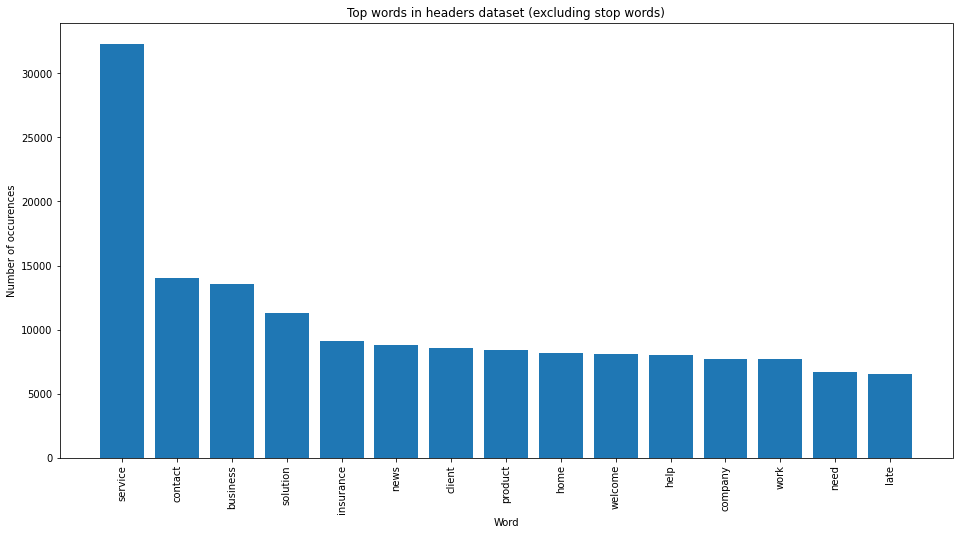

In [ ]:
count_vectorizer = CountVectorizer(stop_words='english')
words, word_values = get_top_n_words(n_top_words=15,
                                     count_vectorizer=count_vectorizer, 
                                     text_data=d0["headers"])

fig, ax = plt.subplots(figsize=(16,8))
ax.bar(range(len(words)), word_values)
ax.set_xticks(range(len(words)))
ax.set_xticklabels(words, rotation='vertical')
ax.set_title('Top words in headers dataset (excluding stop words)')
ax.set_xlabel('Word')
ax.set_ylabel('Number of occurences')
plt.show()

In [ ]:
vect = TfidfVectorizer(stop_words='english', max_features=100)
text = d0.headers.values[:30000]

print('Headline before vectorization: {}'.format(text[321]))

document_term_matrix = vect.fit_transform(text)

print('Headline after vectorization: \n{}'.format(document_term_matrix[321]))

Headline before vectorization: dedicate provide care feature product welcome family resource quick link patient tool
Headline after vectorization: 
  (0, 23)	0.32529598182199304
  (0, 47)	0.3221988963547301
  (0, 68)	0.28337694805209734
  (0, 72)	0.307820059408643
  (0, 74)	0.3450494799839559
  (0, 78)	0.34958209802595475
  (0, 62)	0.3482348103420619
  (0, 97)	0.2472946347483826
  (0, 4)	0.28650910283193765
  (0, 22)	0.33096576760187996


**Visualizing LDA model**

In [ ]:
# Parameters tuning using Grid Search
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
grid_params = {'n_components' : list(range(5,10))}

# LDA model
lda = LatentDirichletAllocation()
lda_model = GridSearchCV(lda,param_grid=grid_params)
lda_model.fit(document_term_matrix)

# Best LDA model
best_lda_model = lda_model.best_estimator_

print("Best LDA model's params" , lda_model.best_params_)
print("Best log likelihood Score for the LDA model",lda_model.best_score_)
print("LDA model Perplexity on train data", best_lda_model.perplexity(document_term_matrix))

Best LDA model's params {'n_components': 5}
Best log likelihood Score for the LDA model -66881.94615062789
LDA model Perplexity on train data 161.47101820666353


In [ ]:
import pyLDAvis.sklearn

pyLDAvis.enable_notebook()

In [ ]:
lda_panel = pyLDAvis.sklearn.prepare(best_lda_model, document_term_matrix , vect , mds='tsne')
lda_panel

PreparedData(topic_coordinates=                x           y  topics  cluster       Freq
topic                                                    
4      150.222153  -72.269554       1        1  22.137510
3       51.163364 -159.968018       2        1  20.990768
2      -73.144554   21.523815       3        1  20.720906
0      -66.410133 -110.606438       4        1  18.789599
1       54.417324   12.443444       5        1  17.361217, topic_info=          Term         Freq        Total Category  logprob  loglift
38   insurance  1328.000000  1328.000000  Default  30.0000  30.0000
17      energy  1210.000000  1210.000000  Default  29.0000  29.0000
4         care  1084.000000  1084.000000  Default  28.0000  28.0000
85       solar   803.000000   803.000000  Default  27.0000  27.0000
53     medical   694.000000   694.000000  Default  26.0000  26.0000
..         ...          ...          ...      ...      ...      ...
50        make   102.388788   718.826845   Topic5  -4.6928  -0.1979
3     business   139.047399  1285.834500   Topic5  -4.3868  -0.4734
97     welcome   111.568306  1404.487737   Topic5  -4.6070  -0.7819
20  experience    90.078939   675.983809   Topic5  -4.8209  -0.2646
8       client    96.553112  1043.880058   Topic5  -4.7515  -0.6297

[209 rows x 6 columns], token_table=      Topic      Freq  Term
term                       
0         1  0.131772  area
0         2  0.569827  area
0         3  0.090816  area
0         4  0.085474  area
0         5  0.122869  area
...     ...       ...   ...
99        1  0.417111  year
99        2  0.190633  year
99        3  0.117312  year
99        4  0.135235  year
99        5  0.138494  year

[419 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[5, 4, 3, 1, 2])

**Well, for LDA as we took subset of our dataset and it resulted in only 5 components. It is not giving that much insights that we are getting from clustering.**